# Fast.ai Lesson 9: 目标检测（多目标）

fast.ai 0.7版本

Pytorch 0.3版本

参考：

[【Deep Learning 2: Part 2 Lesson 9】](https://medium.com/@hiromi_suenaga/deep-learning-2-part-2-lesson-9-5f0cf9e4bb5b)

[【DeepLearning-Lec9-Notes】](https://forums.fast.ai/t/deeplearning-lec9-notes/14113?u=cedric)

In [1]:
# jupyter 初始化
%matplotlib inline
%config InlineBackend.figure_format="retina"
%config InlineBackend.rc = {"figure.figsize": (7.5,4.5)}

%reload_ext autoreload
%autoreload 2

In [2]:
# import packages
from fastai.conv_learner import *
from fastai.dataset import *

import json, pdb
from PIL import ImageDraw, ImageFont
from matplotlib import patches, patheffects

# 设置运行GPU
torch.cuda.set_device(1)

关于`torch.backends.cudnn.benchmark=True`的使用

参考链接：[什么情况下应该设置 cudnn.benchmark = True？](https://www.pytorchtutorial.com/when-should-we-set-cudnn-benchmark-to-true/)

大部分情况下，设置这个 flag 可以让内置的 cuDNN 的 auto-tuner 自动寻找最适合当前配置的高效算法，来达到优化运行效率的问题。

一般来讲，应该遵循以下准则：

- 如果网络的输入数据维度或类型上变化不大，设置  torch.backends.cudnn.benchmark = true  可以增加运行效率；
- 如果网络的输入数据在每次 iteration 都变化的话，会导致 cnDNN 每次都会去寻找一遍最优配置，这样反而会降低运行效率。

In [3]:
# 优化运行效率
torch.backends.cudnn.benchmark=True

## 初始设置（同上篇单目标检测的设置相同）

- 路径
- 构建图像-路径-分类-BBox的关系字典
- 可视化功能
- BBox表征方式转换函数

In [4]:
# 路径
PATH = Path('data/pascal2007')

trin_json = json.load((PATH / 'pascal_train2007.json').open())

IMAGES,ANNOTATIONS,CATEGORIES = ['images', 'annotations', 'categories']

FILE_NAME,ID,IMG_ID,CAT_ID,BBOX = ['file_name','id','image_id','category_id','bbox']

JPEGS = 'VOCdevkit/VOC2007/JPEGImages'
IMG_PATH = PATH / JPEGS

In [5]:
# 构建关系字典
# ID->类别
catgoris = {o[ID]:o['name'] for o in trin_json[CATEGORIES]}
# ID->路径
trinFnams = {o[ID]:o[FILE_NAME] for o in trin_json[IMAGES]}
# ID
trinIDs = [o[ID] for o in trin_json[IMAGES]]

In [6]:
# 转换BBOX（x,y,w,h）-> （y1,x1,y2,x2）
def hw_bb(bb):
    return np.array([bb[1],bb[0],bb[3]+bb[1]-1, bb[2]+bb[0]-1])

# 转换BBOX（y1,x1,y2,x2）-> （x,y,w,h）
def bb_hw(bb):
    return np.array([bb[1],bb[0],bb[3]-bb[1]+1,bb[2]-bb[0]+1])

In [12]:
# 标注信息字典：ID->anno
def get_trn_anno():
    trin_anno = collections.defaultdict(lambda:[])
    for o in trin_json[ANNOTATIONS]:
        if not o['ignore']:
            bb = o[BBOX]
            bb = np.array(hw_bb(bb)) # 存储左上右下两点形式
            trin_anno[o[IMG_ID]].append((bb,o[CAT_ID]))
    return trin_anno
            
trinAnnos = get_trn_anno()

In [13]:
# 定义可视化函数

# matplotlib 对象
def show_img(im, figsize=None, ax=None):
    if not ax: fig,ax = plt.subplots(figsize=figsize)
    ax.imshow(im)
    ax.set_xticks(np.linspace(0, 224, 8))
    ax.set_yticks(np.linspace(0, 224, 8))
    ax.grid()
    ax.set_yticklabels([])
    ax.set_xticklabels([])
    return ax

# 图像包边
def draw_outline(o, lw):
    o.set_path_effects([patheffects.Stroke(
        linewidth=lw, foreground='black'), patheffects.Normal()])

# 绘制BBOX    
def draw_rect(ax, b, color='white'):
    patch = ax.add_patch(patches.Rectangle(b[:2], *b[-2:], fill=False, edgecolor=color, lw=2))
    draw_outline(patch, 4)

# 绘制文本
def draw_text(ax, xy, txt, sz=14, color='white'):
    text = ax.text(*xy, txt,
        verticalalignment='top', color=color, fontsize=sz, weight='bold')
    draw_outline(text, 1)

# 绘制图像和标注
def draw_im(im, ann):
    ax = show_img(im, figsize=(16,8))
    for b,c in ann:
        b = bb_hw(b)
        draw_rect(ax, b)
        draw_text(ax, b[:2], catgoris[c], sz=16)

# 根据ID绘制图像
def draw_idx(i):
    im_a = trinAnnos[i]
    im = open_image(IMG_PATH/trinFnams[i])
    draw_im(im, im_a)

## 多标签分类问题

如同卫星图像分类一样，一幅图分配几个分类标签

### 数据预处理

In [31]:
MC_CSV = PATH/'tmp/mc.csv'

In [22]:
trinAnnos[12]

[(array([ 96, 155, 269, 350]), 7)]

In [28]:
# 统计每幅图中的分类，set的作用是方式重复
multiClass = [set(catgoris[p[1]] for p in trinAnnos[o]) for o in trinIDs]
# 统计每幅图中的分类，用空格分开
multiClasses = [' '.join(str(p) for p in o) for o in multiClass]

In [32]:
# 写入CSV文件
df = pd.DataFrame({'fn': [trinFnams[o] for o in trinIDs], 'clas': multiClasses}, columns=['fn','clas'])
df.to_csv(MC_CSV, index=False)

### 多分类模型和训练

In [33]:
f_model=resnet34
sz=224
bs=64

In [34]:
tfms = tfms_from_model(f_model=f_model, sz=sz,crop_type=CropType.NO)
md = ImageClassifierData.from_csv(path=PATH, folder=JPEGS, csv_fname=MC_CSV, tfms=tfms, bs=bs)

In [35]:
# 设置学习器及优化函数
learn = ConvLearner.pretrained(f_model,data=md)
learn.opt_fn = optim.Adam

In [36]:
# 找最优学习率
lrf=learn.lr_find(1e-5,100)

epoch      trn_loss   val_loss   <lambda>                  
    0      1.33405    13.517095  0.5108    



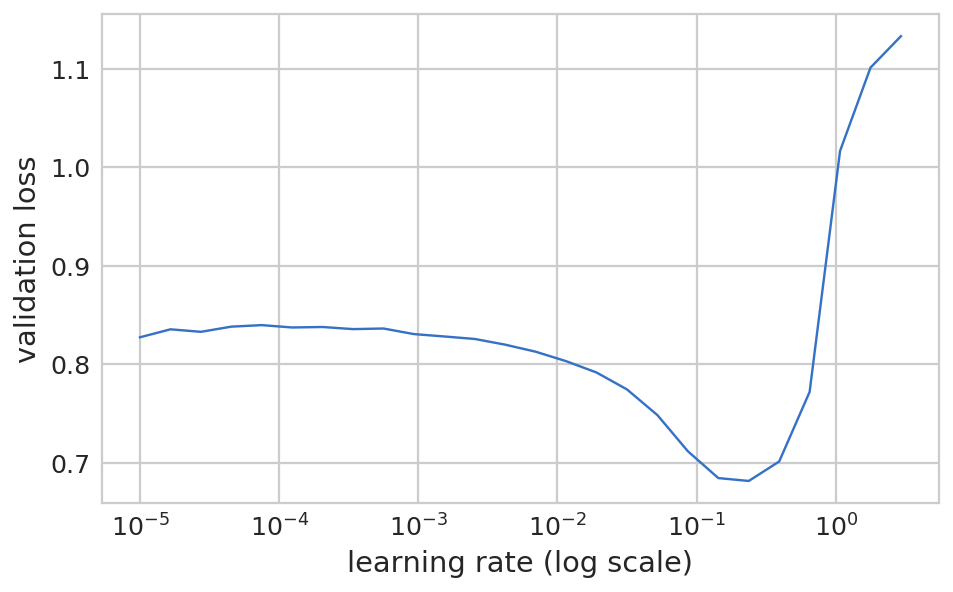

In [37]:
learn.sched.plot(0)

In [38]:
lr = 2e-2

关于use_clr的用法：第一个参数是关于精度的，从lr的1/32开始，第二个参数是上升与下降比例。

In [39]:
learn.fit(lr, 1, cycle_len=3, use_clr=(32,5))

epoch      trn_loss   val_loss   <lambda>                  
    0      0.322894   0.165013   0.9484    
    1      0.173385   0.079073   0.9731                    
    2      0.116328   0.074583   0.9748                    



[array([0.07458]), 0.9747999939918518]

In [40]:
lrs = np.array([lr/100, lr/10, lr])

In [41]:
learn.freeze_to(-2)

 84%|████████▍ | 27/32 [00:05<00:00,  7.20it/s, loss=0.243] 


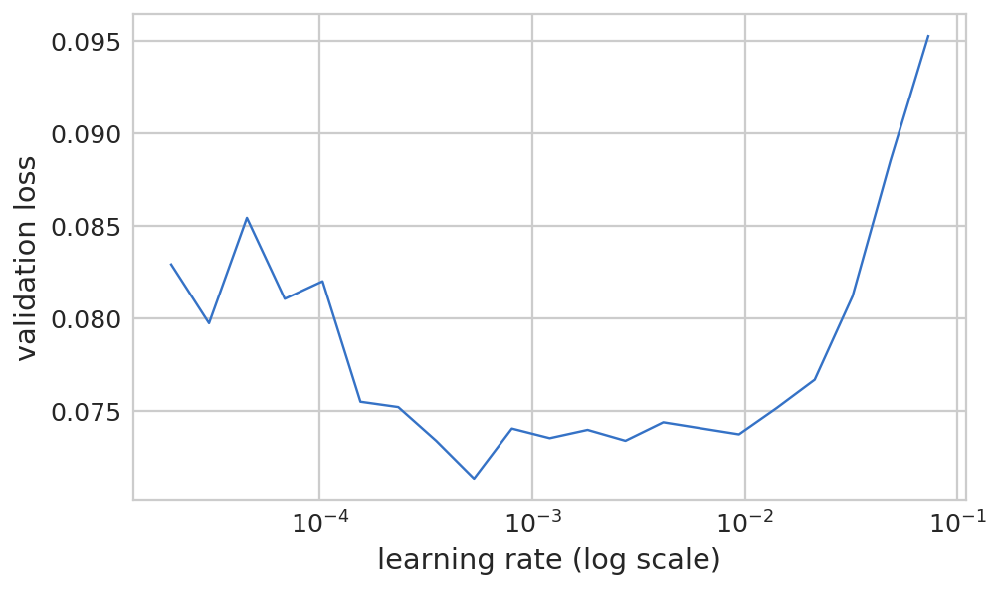

In [42]:
learn.lr_find(lrs/1000)
learn.sched.plot(0)

In [43]:
learn.fit(lrs/10, 1, cycle_len=5, use_clr=(32,5))

epoch      trn_loss   val_loss   <lambda>                   
    0      0.075259   0.078922   0.9734    
    1      0.054866   0.080068   0.9744                     
    2      0.03906    0.079555   0.9764                     
    3      0.028415   0.073445   0.9767                     
    4      0.02       0.075055   0.9771                     



[array([0.07505]), 0.9770999913215637]

In [44]:
# 保存/加载模型
learn.save('mclas')
learn.load('mclas')

In [46]:
y = learn.predict() # 默认用Validation集进行预测
x,_ = next(iter(md.val_dl))
x = to_np(x)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


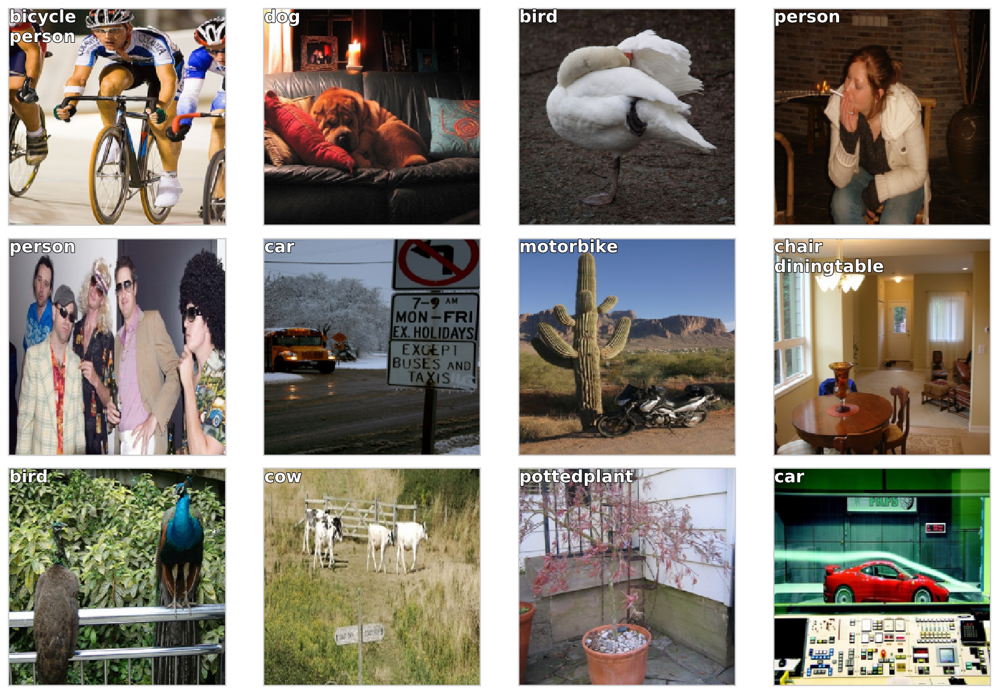

In [47]:
# 查看多分类效果
fig, axes = plt.subplots(3, 4, figsize=(12, 8))
for i,ax in enumerate(axes.flat):
    ima=md.val_ds.denorm(x)[i]
    ya = np.nonzero(y[i]>0.4)[0]
    b = '\n'.join(md.classes[o] for o in ya)
    ax = show_img(ima, ax=ax)
    draw_text(ax, (0,0), b)
plt.tight_layout()

多分类还是比较简单直白的。

## 目标检测

按照Howard教授讲的,实现一个粗糙版本的SSD，继而进行改进。

训练网络的三要素：
1. 数据
2. 网络结构
3. Loss函数

In [49]:
# 超参数
f_model=resnet34
sz=224
bs=64

### 数据

#### 构建多分类数据集

In [68]:
multiClass = [[catgoris[p[1]] for p in trinAnnos[o]] for o in trinIDs] # 这次没用到set,是因为要用到每个bbox的对应的标签

# 构建索引：ID->分类名
Id2Catgris = list(catgoris.values())
# 构建索引：分类名->ID
Catgris2Id = {v:k for k,v in enumerate(Id2Catgris)} 

In [69]:
# 构建索引:图像ID->各图像中的分类ID
multiClasses = np.array([np.array([Catgris2Id[p] for p in o]) for o in multiClass])

In [70]:
# 可以看到，multiClasses里包含就是每幅图的分类ID（可重复）
multiClasses

array([array([6]), array([14, 12]), array([ 1,  1, 14, 14, 14]), ..., array([17,  8, 14, 14, 14]),
       array([6]), array([11])], dtype=object)

In [71]:
# 交叉验证分割
val_idxs = get_cv_idxs(len(trinFnams))
((val_mcs,trn_mcs),) = split_by_idx(val_idxs, multiClasses)

#### 构建BBox的数据集

In [72]:
MBB_CSV = PATH/'tmp/mbb.csv'

In [73]:
# 获取BBOX的数据
multiBBox = [np.concatenate([p[0] for p in trinAnnos[o]]) for o in trinIDs]
multiBBoxes = [' '.join(str(p) for p in o) for o in multiBBox] # 转换成空格间隔，用于存入CSV

df = pd.DataFrame({'fn':[trinFnams[o] for o in trinIDs], 'bbox':multiBBoxes}, columns=['fn','bbox'])
df.to_csv(MBB_CSV, index=False)

In [74]:
df.head()

,fn,bbox
0,000012.jpg,96 155 269 350
1,000017.jpg,61 184 198 278 77 89 335 402
2,000023.jpg,229 8 499 244 219 229 499 333 0 1 368 116 1 2 ...
3,000026.jpg,124 89 211 336
4,000032.jpg,77 103 182 374 87 132 122 196 179 194 228 212 ...


In [65]:
# 用于BBOX的数据增强，注意COORD格式
aug_tfms = [RandomRotate(3, p=0.5, tfm_y=TfmType.COORD),
            RandomLighting(0.05, 0.05, tfm_y=TfmType.COORD),
            RandomFlip(tfm_y=TfmType.COORD)]
tfms = tfms_from_model(f_model, sz, crop_type=CropType.NO, tfm_y=TfmType.COORD, aug_tfms=aug_tfms)
md = ImageClassifierData.from_csv(PATH, JPEGS, MBB_CSV, tfms=tfms, bs=bs, continuous=True, num_workers=4)

#### 对多分类数据集和BBox数据集进行拼接

In [75]:
# 构造一个拼接的数据集：multiBBox + multiClasses
# 注意：都是通过ID索引的
class ConcatLblDataset(Dataset):
    def __init__(self, ds, y2):
        self.ds,self.y2 = ds,y2
        self.sz = ds.sz
    def __len__(self): return len(self.ds)
    
    def __getitem__(self, i):
        x,y = self.ds[i]
        return (x, (y,self.y2[i]))

In [76]:
# 拼接并替换
trn_ds2 = ConcatLblDataset(md.trn_ds, trn_mcs)
val_ds2 = ConcatLblDataset(md.val_ds, val_mcs)
md.trn_dl.dataset = trn_ds2
md.val_dl.dataset = val_ds2

#### 查看新构建的数据集

In [78]:
import matplotlib.cm as cmx
import matplotlib.colors as mcolors
from cycler import cycler

def get_cmap(N):
    color_norm  = mcolors.Normalize(vmin=0, vmax=N-1)
    return cmx.ScalarMappable(norm=color_norm, cmap='Set3').to_rgba

num_colr = 12
cmap = get_cmap(num_colr)
colr_list = [cmap(float(x)) for x in range(num_colr)]

In [104]:
def show_ground_truth(ax, im, bbox, clas=None, prs=None, thresh=0.3):
    bb = [bb_hw(o) for o in bbox.reshape(-1,4)]
    if prs is None:  prs  = [None]*len(bb)
    if clas is None: clas = [None]*len(bb)
    ax = show_img(im, ax=ax)
    for i,(b,c,pr) in enumerate(zip(bb, clas, prs)):
        # 注意：原jupyter此处条件之一是b[2]>0，意思是宽大于0即可，调试发现并不可，需大于1
        if((b[2]>1) and (pr is None or pr > thresh)):
            draw_rect(ax, b, color=colr_list[i%num_colr])
            txt = f'{i}: '
            if c is not None: txt += ('bg' if c==len(Id2Catgris) else Id2Catgris[c])
            if pr is not None: txt += f' {pr:.2f}'
            draw_text(ax, b[:2], txt, color=colr_list[i%num_colr])

In [102]:
# 取一个batch
x,y = to_np(next(iter(md.val_dl)))
x = md.val_ds.ds.denorm(x)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


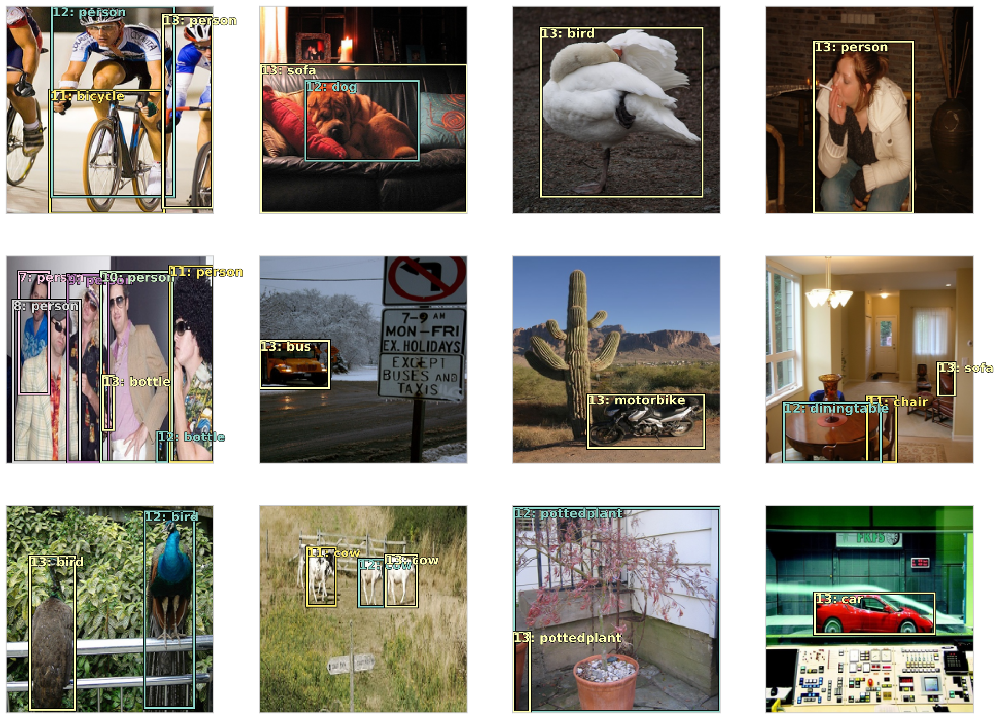

In [105]:
# 可视化
fig, axes = plt.subplots(3,4, figsize=(16,12))
for i,ax in enumerate(axes.flat):
    show_ground_truth(ax, x[i], y[0][i], y[1][i]) # x[i] 图像， y[0][i] BBoxs，y[1][i]classes
plt.tight_layout()

### 网络结构

先构建简单的模型，后继续改进。先用4x4 anchor。

这里用的是SSD的方式：
- SSD的方式是在原有ResNet主干后增加一个stride为2的卷积层，得到4x4的tensor，对每个Tensor做（4+C）的目标检测，共4*4*（4+C）；
- YOLO的方式是直接构建16*(4+C)的Linear层。

#### anchor设置

参数介绍：
- anc_grid = how big of a square grid to make (subdivision)
- anc_offset = center offsets
- anc_x = x coordinates for centers
- anc_y = y coordinates for centers
- anc_ctrs - the actual coordinates for the grid centers
- anc_sizes - size of the quadrants

In [106]:
# anchor 超参数
anc_grid = 4 # 将图像细分的个数
k = 1

# 构建anchor
anc_offset = 1/(anc_grid*2) # anchors中心偏移（小数形式）
anc_x = np.repeat(np.linspace(anc_offset, 1 - anc_offset, anc_grid), anc_grid) # 横轴 anchor中心分布（小数形式）
anc_y = np.tile(np.linspace(anc_offset,1-anc_offset,anc_grid),anc_grid) # 纵轴 anchor中心分布（小数形式）

anc_ctrs = np.tile(np.stack([anc_x,anc_y], axis=1), (k,1)) # anchor中心实际坐标
anc_sizes = np.array([[1/anc_grid,1/anc_grid] for i in range(anc_grid*anc_grid)]) # 每个anchor的size（实际大小）
anchors = V(np.concatenate([anc_ctrs, anc_sizes], axis=1), requires_grad=False).float() # 构建anchor向量，放入GPU

In [108]:
grid_sizes = V(np.array([1/anc_grid]), requires_grad=False).unsqueeze(1) # 每个anchor的大小比例,放入GPU

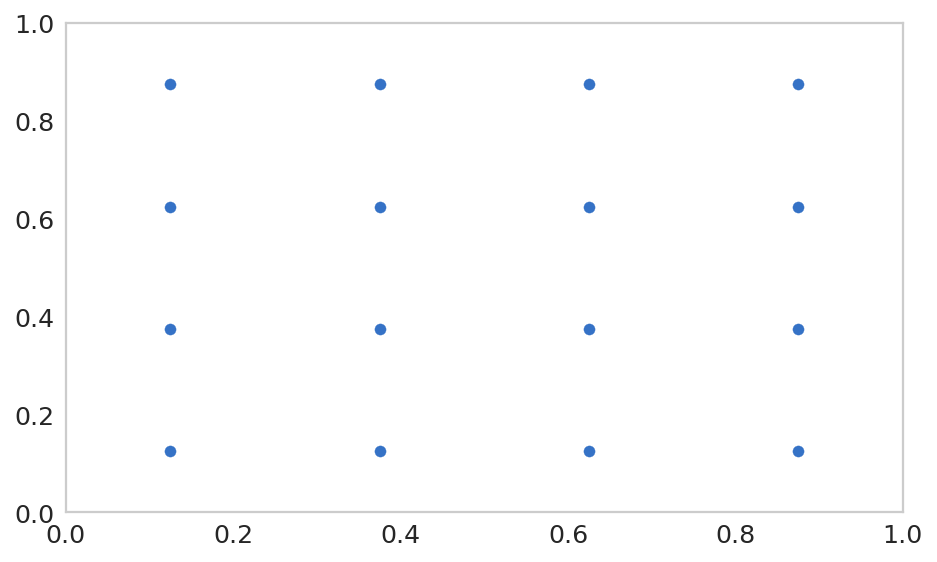

In [118]:
# 绘制anchor分布
plt.grid(False)
plt.scatter(anc_x, anc_y)
plt.xlim(0, 1)
plt.ylim(0, 1);

In [119]:
# 输出anchor 中心和长宽（坐标）
print(anchors)

Variable containing:
 0.1250  0.1250  0.2500  0.2500
 0.1250  0.3750  0.2500  0.2500
 0.1250  0.6250  0.2500  0.2500
 0.1250  0.8750  0.2500  0.2500
 0.3750  0.1250  0.2500  0.2500
 0.3750  0.3750  0.2500  0.2500
 0.3750  0.6250  0.2500  0.2500
 0.3750  0.8750  0.2500  0.2500
 0.6250  0.1250  0.2500  0.2500
 0.6250  0.3750  0.2500  0.2500
 0.6250  0.6250  0.2500  0.2500
 0.6250  0.8750  0.2500  0.2500
 0.8750  0.1250  0.2500  0.2500
 0.8750  0.3750  0.2500  0.2500
 0.8750  0.6250  0.2500  0.2500
 0.8750  0.8750  0.2500  0.2500
[torch.cuda.FloatTensor of size 16x4 (GPU 1)]



In [120]:
# 定义一个anchor的 hw-》左上右下 函数
def hw2corners(ctr, hw):
    return torch.cat([ctr-hw/2,ctr+hw/2],dim=1)

In [123]:
# anchor分布表示：中心宽高-》左上角右下角
anchor_cnr = hw2corners(anchors[:,:2],anchors[:,2:])
anchor_cnr

Variable containing:
 0.0000  0.0000  0.2500  0.2500
 0.0000  0.2500  0.2500  0.5000
 0.0000  0.5000  0.2500  0.7500
 0.0000  0.7500  0.2500  1.0000
 0.2500  0.0000  0.5000  0.2500
 0.2500  0.2500  0.5000  0.5000
 0.2500  0.5000  0.5000  0.7500
 0.2500  0.7500  0.5000  1.0000
 0.5000  0.0000  0.7500  0.2500
 0.5000  0.2500  0.7500  0.5000
 0.5000  0.5000  0.7500  0.7500
 0.5000  0.7500  0.7500  1.0000
 0.7500  0.0000  1.0000  0.2500
 0.7500  0.2500  1.0000  0.5000
 0.7500  0.5000  1.0000  0.7500
 0.7500  0.7500  1.0000  1.0000
[torch.cuda.FloatTensor of size 16x4 (GPU 1)]

#### 自定义高级网络层

以ResNet34为主干，追加更多的卷积层。现在是一层卷积层，用于4x4grid。

In [125]:
n_clas = len(Id2Catgris)+1 # 分类数目
n_act = k*(4+n_clas) # activation个数，暂时不去管k

关于flatten的方式 (pytorch中contiguous())[https://blog.csdn.net/appleml/article/details/80143212]：

view只能用在contiguous的variable上。如果在view之前用了transpose, permute等，需要用contiguous()来返回一个contiguous copy。 

In [129]:
# 一个标准卷积层:使用这种方式来减少错误
class StdConv(nn.Module):
    def __init__(self, nin, nout, stride=2, drop=0.1):
        super().__init__()
        self.conv = nn.Conv2d(nin, nout, 3, stride=stride, padding=1)
        self.bn = nn.BatchNorm2d(nout)
        self.drop = nn.Dropout(drop)
        
    def forward(self, x): return self.drop(self.bn(F.relu(self.conv(x))))


def flatten_conv(x,k):
    bs,nf,gx,gy = x.size()
    x = x.permute(0,2,3,1).contiguous() # 重排
    return x.view(bs,-1,nf//k)

In [130]:
# 定义一个输出卷积层
# oconv1用于分类，oconv2用于定位。
class OutConv(nn.Module):
    def __init__(self, k, nin, bias):
        super().__init__()
        self.k = k
        self.oconv1 = nn.Conv2d(nin, (len(Id2Catgris)+1)*k, 3, padding=1) # +1是用于background
        self.oconv2 = nn.Conv2d(nin, 4*k, 3, padding=1)
        self.oconv1.bias.data.zero_().add_(bias)
        
    # 注意输出的逻辑，写成flatten形式，便于设计实现loss函数
    def forward(self, x):
        return [flatten_conv(self.oconv1(x), self.k),
                flatten_conv(self.oconv2(x), self.k)]

In [132]:
# 定义一个SSD_Head
class SSD_Head(nn.Module):
    def __init__(self, k, bias):
        super().__init__()
        self.drop = nn.Dropout(0.25)
        self.sconv0 = StdConv(512,256, stride=1) # stride为1的卷积并不改变维度大小
#         self.sconv1 = StdConv(256,256)
        self.sconv2 = StdConv(256,256) # 进行标准的卷积层，返回维度大小为4x4,对应图像4个anchor的感受野
        self.out = OutConv(k, 256, bias) # 进行输出层处理，注意返回维度，是两个
        
    def forward(self, x):
        x = self.drop(F.relu(x))
        x = self.sconv0(x)
#         x = self.sconv1(x)
        x = self.sconv2(x)
        return self.out(x)

In [135]:
# 更新模型
head_reg4 = SSD_Head(k, -3.)
models = ConvnetBuilder(f_model, 0, 0, 0, custom_head=head_reg4)
learn = ConvLearner(md, models)
learn.opt_fn = optim.Adam

### 损失函数

损失函数需要先对图像中的目标对应到最后卷积层的其中一个grid中，就可以说是“这个grid是对这一个目标对标的”；

然后进一步地，去衡量坐标的接近程度和分类概率的接近程度。

损失函数：SSD_Loss的计算步骤：
1. 去除zeroPadding
2. 将预测得到的activations转换至BBox（anchor 空间）
3. 计算IOU
4. 将Ground Truth的BBox映射到Anchor 空间
5. 检查是否存在覆盖区域大于0.4的（Ground Truth BBox与4x4的anchors）
6. 寻找匹配的anchor和分类下标
7. 对于为匹配到的，定位background类别
8. L1损失用于定位，二分交叉熵用于分类

#### 多分类损失函数

In [137]:
# 独热编码函数
def one_hot_embedding(labels, num_classes):
    return torch.eye(num_classes)[labels.data.cpu()]

# 定义二分类交叉熵 损失函数
class BCE_Loss(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.num_classes = num_classes

    def forward(self, pred, targ):
        t = one_hot_embedding(targ, self.num_classes+1)
        t = V(t[:,:-1].contiguous())#.cpu()
        x = pred[:,:-1]
        w = self.get_weight(x,t)
        return F.binary_cross_entropy_with_logits(x, t, w, size_average=False)/self.num_classes
    
    def get_weight(self,x,t): return None

In [139]:
# 实例化一个损失函数
loss_f = BCE_Loss(len(Id2Catgris))

#### IOU 计算（定位损失函数） && Matching strategy

In [140]:
# 交叠区域
def intersect(box_a, box_b):
    max_xy = torch.min(box_a[:, None, 2:], box_b[None, :, 2:])
    min_xy = torch.max(box_a[:, None, :2], box_b[None, :, :2])
    inter = torch.clamp((max_xy - min_xy), min=0)
    return inter[:, :, 0] * inter[:, :, 1]

# BBox面积计算
def box_sz(b): return ((b[:, 2]-b[:, 0]) * (b[:, 3]-b[:, 1]))

# IOU函数(也叫jaccard)
def jaccard(box_a, box_b):
    inter = intersect(box_a, box_b)
    union = box_sz(box_a).unsqueeze(1) + box_sz(box_b).unsqueeze(0) - inter
    return inter / union

In [157]:
# 返回实际存在的目标的BBOX和分类
# 实际上就是去除zero padding
def get_y(bbox,clas):
#     pdb.set_trace()
    bbox = bbox.view(-1,4)/sz
    bb_keep = ((bbox[:,2]-bbox[:,0])>0).nonzero()[:,0]
    return bbox[bb_keep],clas[bb_keep]

# 预测的activations映射到anchor空间的BBox
def actn_to_bb(actn, anchors):
    # 缩放成-1~1
    actn_bbs = torch.tanh(actn)
    # 新的BBox中心 
    actn_centers = (actn_bbs[:,:2]/2 * grid_sizes) + anchors[:,:2] 
    # BBox高宽
    actn_hw = (actn_bbs[:,2:]/2+1) * anchors[:,2:]
    return hw2corners(actn_centers, actn_hw)

def map_to_ground_truth(overlaps, print_it=False):
    # max(1)横轴：表示对于每个groundTruth object,哪个anchor覆盖的区域最大，返回最大的值和anchor下标
    prior_overlap, prior_idx = overlaps.max(1)
    if print_it: print(prior_overlap)

    # max(0)纵轴：表示对于每个anchor box，在所有groundTruthObject中，最大的覆盖区域和下标（下表表示对象编号）
    # 返回值中的零可能表示重叠区域为零，也有可能表示最大重叠面积的对象下标为0.不过这个后面会通过覆盖比例来筛选的
    gt_overlap, gt_idx = overlaps.max(0)
    
    # 将gt object对应的anchorbox的重叠置为1.99，设为最大。
    gt_overlap[prior_idx] = 1.99
    
    # 强行将max(1)这一步中的对应groundtruthobject的几个anchor，在gt_idx中，将他们与ground truth obejct的编号对应上。
    # 有些奇怪，但可能是为了确保万无一失吧
    for i,o in enumerate(prior_idx): gt_idx[o] = i 
        
    return gt_overlap,gt_idx


# SSD中单个目标的损失函数
def ssd_1_loss(b_c,b_bb,bbox,clas,print_it=False):
    # 获取实际存在的groundTruth目标（很多时候会充斥0的）
    # 去除Zero Padding
    bbox,clas = get_y(bbox,clas) 
    
    # 将预测的bbox与anchor对应上
    a_ic = actn_to_bb(b_bb, anchors) 
    
    # 计算groundTruth与anchor的重叠
    overlaps = jaccard(bbox.data, anchor_cnr.data) 
    
    # 得到每个anchor值与ground truth object的覆盖面积和对应的object ID
    gt_overlap,gt_idx = map_to_ground_truth(overlaps,print_it) 
    
    # 根据gt_idx索引到分类ID，用于计算分类Loss
    gt_clas = clas[gt_idx]
    
    # 找到覆盖面积大于阈值的anchor box,进行筛选
    pos = gt_overlap > 0.4
    pos_idx = torch.nonzero(pos)[:,0]
    
    # pos不是0就是1，此处将没有分配类别的anchorbox定位背景（bg,下标20）
    gt_clas[1-pos] = len(Id2Catgris)
    
    # ground truth BBox
    gt_bbox = bbox[gt_idx]
    
    # 定位损失通过直接计算绝对误差均值
    loc_loss = ((a_ic[pos_idx] - gt_bbox[pos_idx]).abs()).mean()
    
    # 分类误差通过计算二分类交叉熵来计算
    clas_loss  = loss_f(b_c, gt_clas)
    
    return loc_loss, clas_loss

In [158]:
# SSD损失函数
def ssd_loss(pred,targ,print_it=False):
    lcs,lls = 0.,0.
    for b_c,b_bb,bbox,clas in zip(*pred,*targ):
        # 计算单个的损失
        loc_loss,clas_loss = ssd_1_loss(b_c,b_bb,bbox,clas,print_it) 
        # 定位损失
        lls += loc_loss  
        # 分类损失
        lcs += clas_loss 
    if print_it: print(f'loc: {lls.data[0]}, clas: {lcs.data[0]}')
    # 两者之和作为SSD的损失
    return lls+lcs 

### Loss测试

确保loss函数可行

In [149]:
x,y = next(iter(md.val_dl))
x,y = V(x),V(y)

In [150]:
for i,o in enumerate(y): y[i] = o.cuda()
learn.model.cuda()

Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True)
  (2): ReLU(inplace)
  (3): MaxPool2d(kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), dilation=(1, 1), ceil_mode=False)
  (4): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True)
      (relu): ReLU(inplace)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True)
      (relu): ReLU(inplace)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d

In [151]:
batch = learn.model(x)

In [159]:
ssd_loss(batch, y, True)


 0.1947
 0.1168
 0.2652
[torch.cuda.FloatTensor of size 3 (GPU 1)]


 0.2885
 0.0888
[torch.cuda.FloatTensor of size 2 (GPU 1)]


1.00000e-02 *
  9.9027
[torch.cuda.FloatTensor of size 1 (GPU 1)]


 0.1608
[torch.cuda.FloatTensor of size 1 (GPU 1)]


 0.3237
 0.2153
 0.2558
 0.2013
 0.2526
 0.0485
 0.0879
[torch.cuda.FloatTensor of size 7 (GPU 1)]


 0.3258
[torch.cuda.FloatTensor of size 1 (GPU 1)]


 0.2704
[torch.cuda.FloatTensor of size 1 (GPU 1)]


 0.3985
 0.4538
 0.1897
[torch.cuda.FloatTensor of size 3 (GPU 1)]


 0.1527
 0.1863
[torch.cuda.FloatTensor of size 2 (GPU 1)]


 0.3426
 0.3249
 0.5062
[torch.cuda.FloatTensor of size 3 (GPU 1)]


 0.0642
 0.2506
[torch.cuda.FloatTensor of size 2 (GPU 1)]


 0.2027
[torch.cuda.FloatTensor of size 1 (GPU 1)]


 0.2418
 0.2337
 0.2590
[torch.cuda.FloatTensor of size 3 (GPU 1)]


1.00000e-02 *
  8.4642
[torch.cuda.FloatTensor of size 1 (GPU 1)]


 0.3652
 0.1377
[torch.cuda.FloatTensor of size 2 (GPU 1)]


1.00000e-02 *
  9.5146
  5.739

Variable containing:
 84.2942
[torch.cuda.FloatTensor of size 1 (GPU 1)]

### 训练模型

In [160]:
learn.crit = ssd_loss #指定loss
lr = 3e-3
lrs = np.array([lr/100,lr/10,lr])

epoch      trn_loss   val_loss                            
    0      165.921224 30391.076109



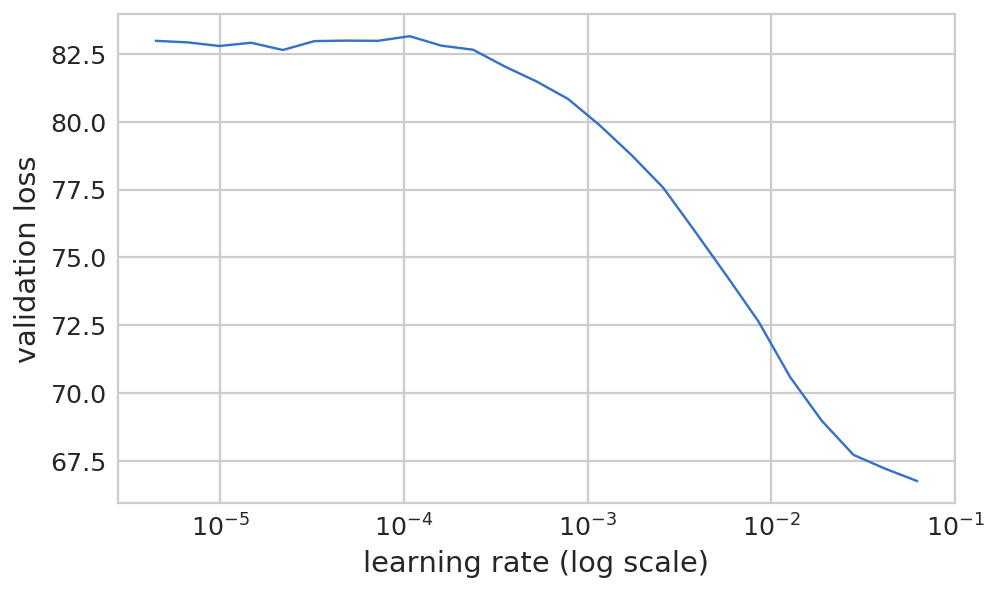

In [161]:
learn.lr_find(lrs/1000,1.)
learn.sched.plot(1)

In [162]:
learn.fit(lr, 1, cycle_len=5, use_clr=(20,10))

epoch      trn_loss   val_loss                            
    0      43.098326  34.007883 
    1      33.96893   28.336332                           
    2      29.650869  26.937769                           
    3      26.758102  26.563267                           
    4      24.590307  26.008181                           



[array([26.00818])]

In [163]:
# 保存模型
learn.save('0')
learn.load('0')

### 测试模型

#### 直接预测

In [164]:
x,y = next(iter(md.val_dl))
x,y = V(x),V(y)
learn.model.eval()
batch = learn.model(x)
b_clas,b_bb = batch

In [165]:
b_clas.size(),b_bb.size()

(torch.Size([64, 16, 21]), torch.Size([64, 16, 4]))

In [166]:
# ground truth 一幅图像
idx=7
b_clasi = b_clas[idx]
b_bboxi = b_bb[idx]
ima=md.val_ds.ds.denorm(to_np(x))[idx]
bbox,clas = get_y(y[0][idx], y[1][idx])
bbox,clas

(Variable containing:
  0.6786  0.4866  0.9911  0.6250
  0.7098  0.0848  0.9911  0.5491
  0.5134  0.8304  0.6696  0.9063
 [torch.cuda.FloatTensor of size 3x4 (GPU 1)], Variable containing:
   8
  10
  17
 [torch.cuda.LongTensor of size 3 (GPU 1)])

In [167]:
# 定义一个可视化函数（torch下的变量需要转换成numpy）
def torch_gt(ax, ima, bbox, clas, prs=None, thresh=0.4):
    return show_ground_truth(ax, ima, to_np((bbox*224).long()),
         to_np(clas), to_np(prs) if prs is not None else None, thresh)

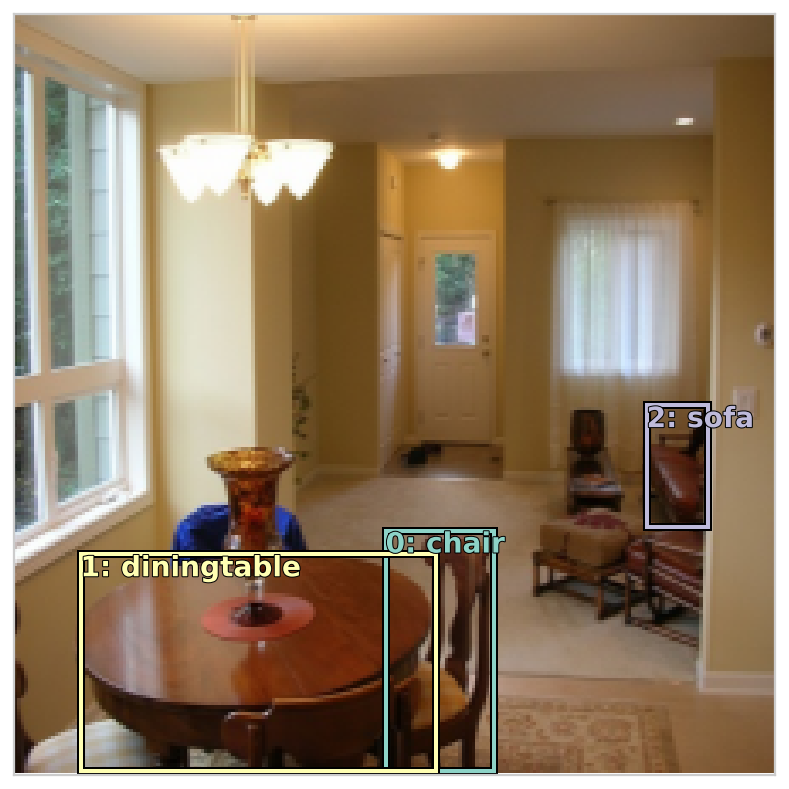

In [168]:
# 可视化ground truth
fig, ax = plt.subplots(figsize=(7,7))
torch_gt(ax, ima, bbox, clas)

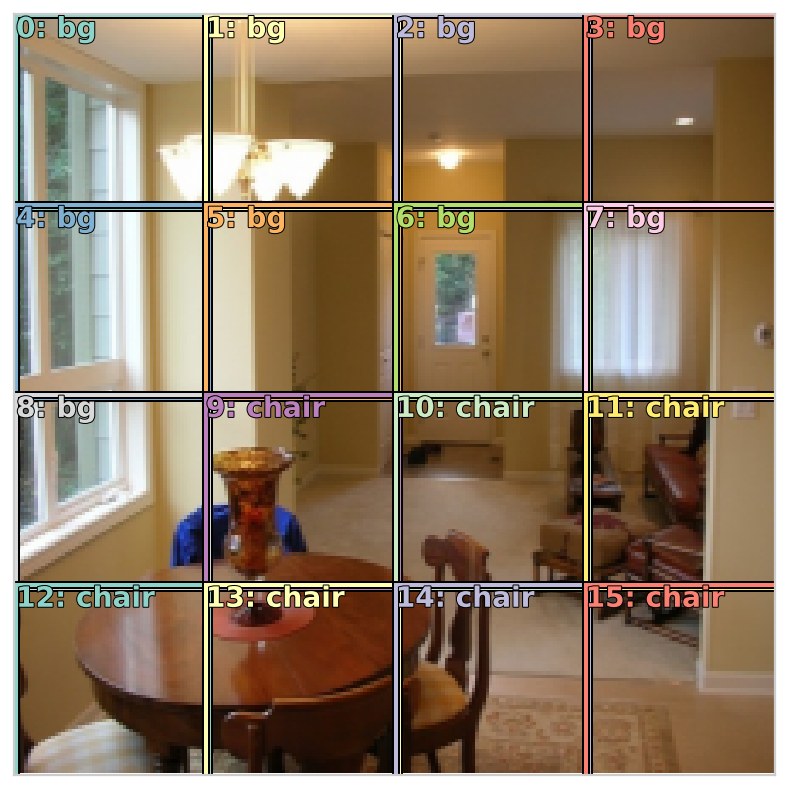

In [169]:
# 可视化 预测结果
fig, ax = plt.subplots(figsize=(7,7))
torch_gt(ax, ima, anchor_cnr, b_clasi.max(1)[1])

#### 过一遍流程，加强理解

In [181]:
grid_sizes

Variable containing:
 0.2500
[torch.cuda.FloatTensor of size 1x1 (GPU 1)]

In [182]:
anchors

Variable containing:
 0.1250  0.1250  0.2500  0.2500
 0.1250  0.3750  0.2500  0.2500
 0.1250  0.6250  0.2500  0.2500
 0.1250  0.8750  0.2500  0.2500
 0.3750  0.1250  0.2500  0.2500
 0.3750  0.3750  0.2500  0.2500
 0.3750  0.6250  0.2500  0.2500
 0.3750  0.8750  0.2500  0.2500
 0.6250  0.1250  0.2500  0.2500
 0.6250  0.3750  0.2500  0.2500
 0.6250  0.6250  0.2500  0.2500
 0.6250  0.8750  0.2500  0.2500
 0.8750  0.1250  0.2500  0.2500
 0.8750  0.3750  0.2500  0.2500
 0.8750  0.6250  0.2500  0.2500
 0.8750  0.8750  0.2500  0.2500
[torch.cuda.FloatTensor of size 16x4 (GPU 1)]

In [183]:
# 预测得到的BBox，将bbox映射到anchor 空间（共16个）
a_ic = actn_to_bb(b_bboxi, anchors)

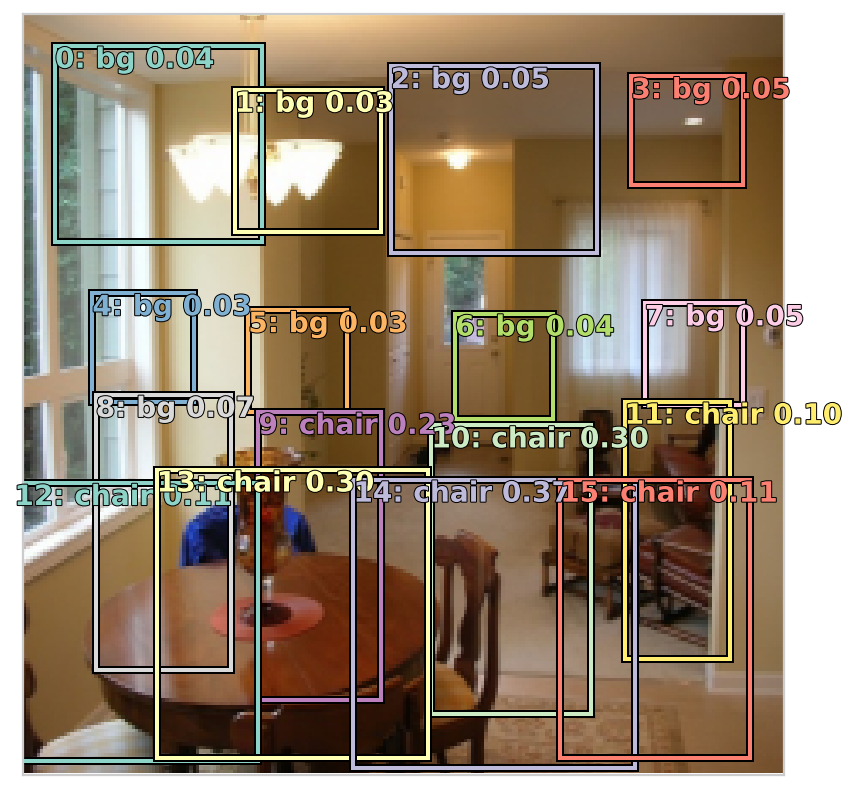

In [184]:
# 可视化预测的结果
fig, ax = plt.subplots(figsize=(7,7))
torch_gt(ax, ima, a_ic, b_clasi.max(1)[1], b_clasi.max(1)[0].sigmoid(), thresh=0.0)

In [185]:
# 计算IOU（ground truth与anchor box）
overlaps = jaccard(bbox.data, anchor_cnr.data)
overlaps



Columns 0 to 9 
 0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0091
 0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0356  0.0549
 0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000  0.0000

Columns 10 to 15 
 0.0922  0.0000  0.0000  0.0315  0.3985  0.0000
 0.0103  0.0000  0.2598  0.4538  0.0653  0.0000
 0.0000  0.1897  0.0000  0.0000  0.0000  0.0000
[torch.cuda.FloatTensor of size 3x16 (GPU 1)]

In [186]:
# 统计anchorBox与ground truth的对应
gt_overlap,gt_idx = map_to_ground_truth(overlaps)
gt_overlap,gt_idx

(
  0.0000
  0.0000
  0.0000
  0.0000
  0.0000
  0.0000
  0.0000
  0.0000
  0.0356
  0.0549
  0.0922
  1.9900
  0.2598
  1.9900
  1.9900
  0.0000
 [torch.cuda.FloatTensor of size 16 (GPU 1)], 
  0
  0
  0
  0
  0
  0
  0
  0
  1
  1
  0
  2
  1
  1
  0
  0
 [torch.cuda.LongTensor of size 16 (GPU 1)])

In [187]:
# 对应的分类标签
gt_clas = clas[gt_idx]; gt_clas

Variable containing:
  8
  8
  8
  8
  8
  8
  8
  8
 10
 10
  8
 17
 10
 10
  8
  8
[torch.cuda.LongTensor of size 16 (GPU 1)]

In [188]:
thresh = 0.5
pos = gt_overlap > thresh
pos_idx = torch.nonzero(pos)[:,0]
neg_idx = torch.nonzero(1-pos)[:,0]
pos_idx


 11
 13
 14
[torch.cuda.LongTensor of size 3 (GPU 1)]

In [191]:
# 给每个anchor box分配分类(注意是ground truth的)
gt_clas[1-pos] = len(Id2Catgris) # 没有分类的设为背景bg
[Id2Catgris[o] if o<len(Id2Catgris) else 'bg' for o in gt_clas.data]

['bg',
 'bg',
 'bg',
 'bg',
 'bg',
 'bg',
 'bg',
 'bg',
 'bg',
 'bg',
 'bg',
 'sofa',
 'bg',
 'diningtable',
 'chair',
 'bg']

In [192]:
# 计算损失函数
gt_bbox = bbox[gt_idx]
loc_loss = ((a_ic[pos_idx] - gt_bbox[pos_idx]).abs()).mean()
clas_loss  = F.cross_entropy(b_clasi, gt_clas)
loc_loss,clas_loss

(Variable containing:
 1.00000e-02 *
   6.3615
 [torch.cuda.FloatTensor of size 1 (GPU 1)], Variable containing:
  0.9142
 [torch.cuda.FloatTensor of size 1 (GPU 1)])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


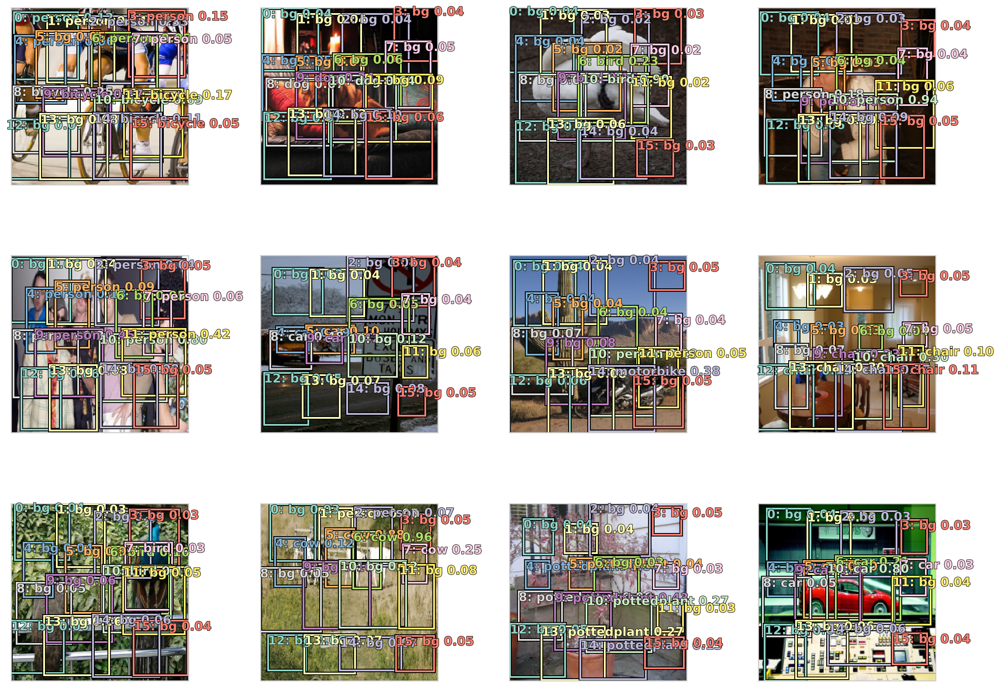

In [193]:
# 可视化一些预测结果
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
for idx,ax in enumerate(axes.flat):
    ima=md.val_ds.ds.denorm(to_np(x))[idx]
    bbox,clas = get_y(y[0][idx], y[1][idx])
    ima=md.val_ds.ds.denorm(to_np(x))[idx]
    bbox,clas = get_y(bbox,clas); bbox,clas
    a_ic = actn_to_bb(b_bb[idx], anchors)
    torch_gt(ax, ima, a_ic, b_clas[idx].max(1)[1], b_clas[idx].max(1)[0].sigmoid(), 0.01)
plt.tight_layout()

## 进一步的改进：更多的anchor box

提升的途径：
1. 不同大小的Anchor Boxes -> anc_zooms
2. 不同长宽比的Anchor Boxes -> anc_ratios
3. 使用更多的卷积层来产生Anchor Boxes -> anc_grids

### 创建更多的anchor

In [197]:
# 生成anchor的尺寸的查找表

# 参数列表
anc_grids = [4,2,1]
anc_zooms = [0.7, 1., 1.3]
anc_ratios = [(1.,1.), (1.,0.5), (0.5,1.)]

# 生成不同尺寸,生成一个LOT查找表
anchor_scales = [(anz*i, anz*j) for anz in anc_zooms for (i,j) in anc_ratios]

# anchor 选项个数
k = len(anchor_scales)

# offsets
anc_offsets = [1/(o*2) for o in anc_grids]

k

9

In [198]:
anc_x = np.concatenate([np.repeat(np.linspace(ao, 1-ao,ag),ag) # 生成anchor 横轴中心
                       for ao,ag in zip(anc_offsets, anc_grids)])
anc_y = np.concatenate([np.tile(np.linspace(ao,1-ao,ag), ag)   # 生成anchor 纵轴中心
                       for ao,ag in zip(anc_offsets,anc_grids)])

anc_ctrs = np.repeat(np.stack([anc_x,anc_y],axis=1),k,axis=0) 

In [204]:
anc_sizes  =   np.concatenate([np.array([[o/ag,p/ag] 
                                         for i in range(ag*ag) 
                                         for o,p in anchor_scales]) 
                               for ag in anc_grids])

grid_sizes = V(np.concatenate([np.array([ 1/ag  
                                         for i in range(ag*ag) 
                                         for o,p in anchor_scales])
                               for ag in anc_grids]), requires_grad=False).unsqueeze(1)

# 计算anchor,注意送入GPU
anchors = V(np.concatenate([anc_ctrs, anc_sizes], axis=1), requires_grad=False).float()

# 转换成（左上/右下形式）
anchor_cnr = hw2corners(anchors[:,:2],anchors[:,2:])

In [209]:
x,y=to_np(next(iter(md.val_dl)))
x=md.val_ds.ds.denorm(x)

In [210]:
a=np.reshape((to_np(anchor_cnr) + to_np(torch.randn(*anchor_cnr.size()))*0.01)*224, -1)

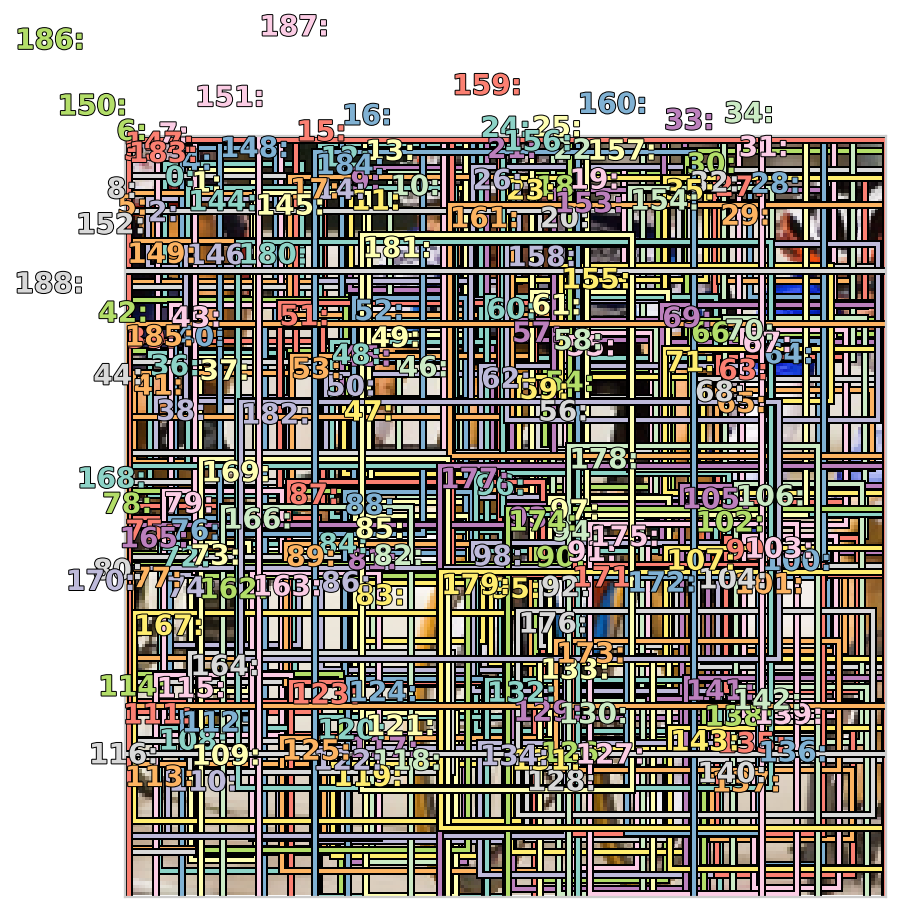

In [211]:
fig, ax = plt.subplots(figsize=(7,7))
show_ground_truth(ax, x[0], a)

### 创建模型

![image.png](https://cdn-images-1.medium.com/max/800/1*C67J9RhTAiz9MCD-ebpp_w.png)

理一下思路：
1. 已经有了GroundTruth（包括4个BBox坐标点和1个分类的集合）；
2. 已经有了一个神经网络可以接收输入图像，并且得到输出activation（激励）；
3. activations与Ground Truth进行对比，计算loss，然后就是求导更新权重；
4. 【匹配问题】定义的损失函数loss function能够比较activation和ground truth，计算得到的值用于衡量activation的好坏。为此，对于ground  truth中的每个Object，需要决定一组(4+C)的activation与之对比。
5. 因为使用的SSD的方式，所以匹配的anchorBox并不是随意的，用于匹配的activation，其感受野(reception filed)需要与ground truth中的Object所处的位置具有最大的重叠。
6. 匹配问题解决后，即Loss解决后，其他的操作和单目标检测相同。

关于参数k的使用：

grid cell可以使不同大小的（anc_grid）,grid cell中可以有不同长宽比和缩放比的anchor box；

anchor box的数目即对应了卷积层activation的组数目，但并不表示每个卷积层需要那么多组activation，因为4x4的卷积层有16组，2x2的卷积层有4组，1x1的卷积层有1组，这样就有了1+4+16组。

接下来只需要知道参数k，k表示的是长宽比和缩放比的组合数。这样，1xk+4xk+16xk，就是全部的anchor box数目了。

In [212]:
drop=0.4

class SSD_MultiHead(nn.Module):
    def __init__(self, k, bias):
        super().__init__()
        self.drop = nn.Dropout(drop)
        # stride=1 不改size
        self.sconv0 = StdConv(512,256, stride=1, drop=drop)
        # conv1 4x4
        self.sconv1 = StdConv(256,256, drop=drop)
        # conv2 2x2
        self.sconv2 = StdConv(256,256, drop=drop)
        # conv3 1x1
        self.sconv3 = StdConv(256,256, drop=drop)
        self.out0 = OutConv(k, 256, bias)
        self.out1 = OutConv(k, 256, bias)
        self.out2 = OutConv(k, 256, bias)
        self.out3 = OutConv(k, 256, bias)

    def forward(self, x):
        x = self.drop(F.relu(x))
        x = self.sconv0(x)
        x = self.sconv1(x)
        o1c,o1l = self.out1(x) # 4x4xk
        x = self.sconv2(x)
        o2c,o2l = self.out2(x) # 2x2xk
        x = self.sconv3(x)
        o3c,o3l = self.out3(x) # 1x1xk
        return [torch.cat([o1c,o2c,o3c], dim=1),
                torch.cat([o1l,o2l,o3l], dim=1)]

head_reg4 = SSD_MultiHead(k, -4.)
models = ConvnetBuilder(f_model, 0, 0, 0, custom_head=head_reg4)
learn = ConvLearner(md, models)
learn.opt_fn = optim.Adam

### 训练和测试

In [215]:
learn.crit = ssd_loss
lr = 1e-2
lrs = np.array([lr/100,lr/10,lr])

In [216]:
x,y = next(iter(md.val_dl))
x,y = V(x),V(y)
batch = learn.model(V(x))

In [217]:
batch[0].size(),batch[1].size()

(torch.Size([64, 189, 21]), torch.Size([64, 189, 4]))

In [218]:
# 查看loss函数适用
ssd_loss(batch, y, True)


 0.5598
 0.7922
 0.3095
[torch.cuda.FloatTensor of size 3 (GPU 1)]


 0.6075
 0.7035
[torch.cuda.FloatTensor of size 2 (GPU 1)]


 0.7764
[torch.cuda.FloatTensor of size 1 (GPU 1)]


 0.7268
[torch.cuda.FloatTensor of size 1 (GPU 1)]


 0.5163
 0.4763
 0.3709
 0.4986
 0.2990
 0.0887
 0.1046
[torch.cuda.FloatTensor of size 7 (GPU 1)]


 0.3789
[torch.cuda.FloatTensor of size 1 (GPU 1)]


 0.5153
[torch.cuda.FloatTensor of size 1 (GPU 1)]


 0.3985
 0.6215
 0.5742
[torch.cuda.FloatTensor of size 3 (GPU 1)]


 0.4246
 0.5208
[torch.cuda.FloatTensor of size 2 (GPU 1)]


 0.3426
 0.3257
 0.5062
[torch.cuda.FloatTensor of size 3 (GPU 1)]


 0.9734
 0.2506
[torch.cuda.FloatTensor of size 2 (GPU 1)]


 0.4477
[torch.cuda.FloatTensor of size 1 (GPU 1)]


 0.7722
 0.5177
 0.6392
[torch.cuda.FloatTensor of size 3 (GPU 1)]


 0.7384
[torch.cuda.FloatTensor of size 1 (GPU 1)]


 0.4679
 0.8901
[torch.cuda.FloatTensor of size 2 (GPU 1)]


 0.6597
 0.1221
[torch.cuda.FloatTensor of size 2 (GPU 1)]



Variable containing:
 332.3745
[torch.cuda.FloatTensor of size 1 (GPU 1)]

epoch      trn_loss   val_loss                           
    0      428.072253 7912290.892



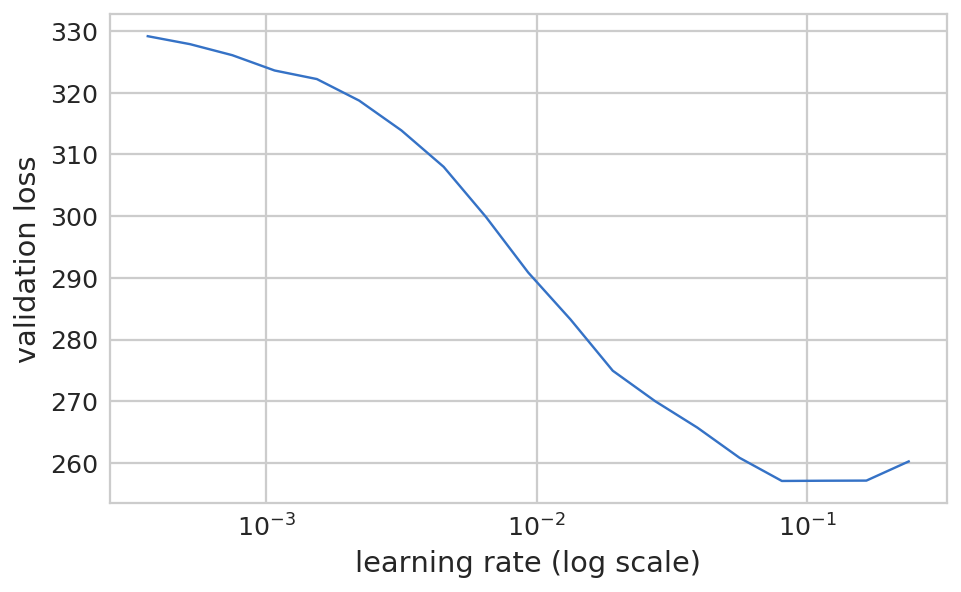

In [219]:
learn.lr_find(lrs/1000,1.)
learn.sched.plot(n_skip_end=2)

In [220]:
learn.fit(lrs, 1, cycle_len=4, use_clr=(20,8))

epoch      trn_loss   val_loss                           
    0      162.041704 142.485135
    1      129.785899 104.201066                         
    2      110.773746 93.877435                          
    3      98.444387  89.302771                          



[array([89.30277])]

In [221]:
learn.save('tmp')

In [222]:
learn.freeze_to(-2)
learn.fit(lrs/2, 1, cycle_len=4, use_clr=(20,8))

epoch      trn_loss   val_loss                            
    0      91.526261  110.951304
    1      86.313832  88.162423                           
    2      78.734507  82.294672                           
    3      71.840125  77.196213                           



[array([77.19621])]

In [223]:
learn.save('prefocal')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


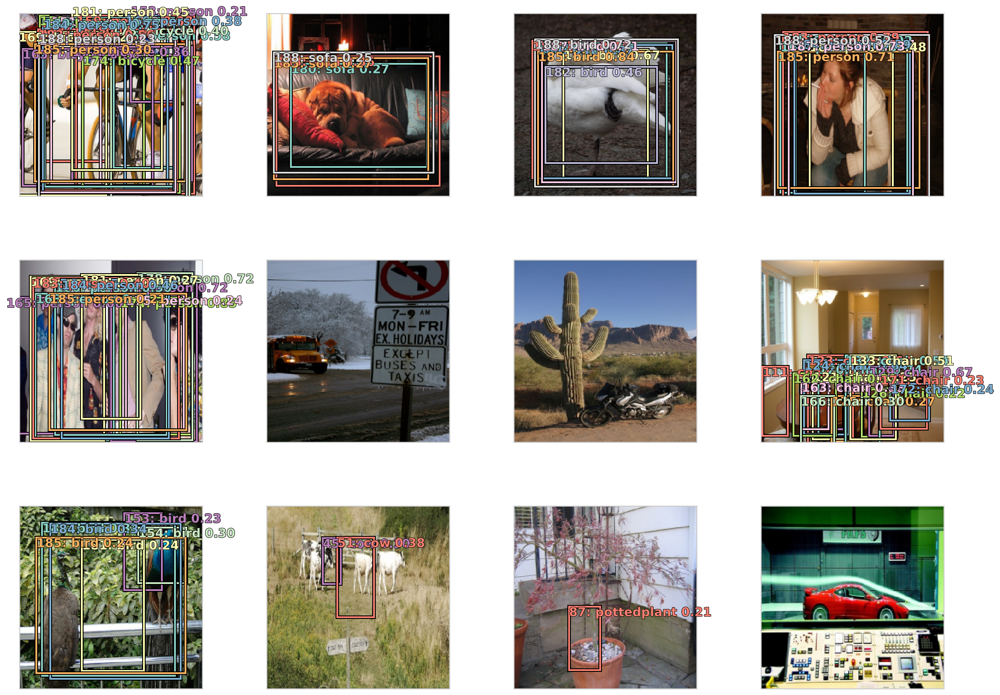

In [224]:
# 测试
x,y = next(iter(md.val_dl))
y = V(y)
batch = learn.model(V(x))
b_clas,b_bb = batch
x = to_np(x)

fig, axes = plt.subplots(3, 4, figsize=(16, 12))
for idx,ax in enumerate(axes.flat):
    ima=md.val_ds.ds.denorm(x)[idx]
    bbox,clas = get_y(y[0][idx], y[1][idx])
    a_ic = actn_to_bb(b_bb[idx], anchors)
    torch_gt(ax, ima, a_ic, b_clas[idx].max(1)[1], b_clas[idx].max(1)[0].sigmoid(), 0.21)
plt.tight_layout()

上面打印出来的是置信度大于0.2的，一些图看起来很有改进空间。

## Focal Loss

论文《Focal Loss for Dense Object Detection》https://arxiv.org/abs/1708.02002

Focal Loss 就是一个解决分类问题中类别不平衡、分类难度差异的一个 loss。

相关博文：[《何恺明大神的「Focal Loss」，如何更好地理解？》](https://zhuanlan.zhihu.com/p/32423092)

### 定义Focal Loss

In [227]:
# 定义FocalLoss,基于二分交叉熵进行改进
class FocalLoss(BCE_Loss):
    def get_weight(self,x,t):
        alpha,gamma = 0.25,1
        p = x.sigmoid()
        pt = p*t + (1-p)*(1-t)
        w = alpha*t + (1-alpha)*(1-t)
        return w * (1-pt).pow(gamma)

loss_f = FocalLoss(len(Id2Catgris))

In [229]:
# 测试Loss函数
x,y = next(iter(md.val_dl))
x,y = V(x),V(y)
batch = learn.model(x)
ssd_loss(batch, y, True)


 0.5598
 0.7922
 0.3095
[torch.cuda.FloatTensor of size 3 (GPU 1)]


 0.6075
 0.7035
[torch.cuda.FloatTensor of size 2 (GPU 1)]


 0.7764
[torch.cuda.FloatTensor of size 1 (GPU 1)]


 0.7268
[torch.cuda.FloatTensor of size 1 (GPU 1)]


 0.5163
 0.4763
 0.3709
 0.4986
 0.2990
 0.0887
 0.1046
[torch.cuda.FloatTensor of size 7 (GPU 1)]


 0.3789
[torch.cuda.FloatTensor of size 1 (GPU 1)]


 0.5153
[torch.cuda.FloatTensor of size 1 (GPU 1)]


 0.3985
 0.6215
 0.5742
[torch.cuda.FloatTensor of size 3 (GPU 1)]


 0.4246
 0.5208
[torch.cuda.FloatTensor of size 2 (GPU 1)]


 0.3426
 0.3257
 0.5062
[torch.cuda.FloatTensor of size 3 (GPU 1)]


 0.9734
 0.2506
[torch.cuda.FloatTensor of size 2 (GPU 1)]


 0.4477
[torch.cuda.FloatTensor of size 1 (GPU 1)]


 0.7722
 0.5177
 0.6392
[torch.cuda.FloatTensor of size 3 (GPU 1)]


 0.7384
[torch.cuda.FloatTensor of size 1 (GPU 1)]


 0.4679
 0.8901
[torch.cuda.FloatTensor of size 2 (GPU 1)]


 0.6597
 0.1221
[torch.cuda.FloatTensor of size 2 (GPU 1)]



Variable containing:
 21.3059
[torch.cuda.FloatTensor of size 1 (GPU 1)]

### 训练和测试

 91%|█████████ | 29/32 [00:17<00:01,  1.79it/s, loss=26.2]

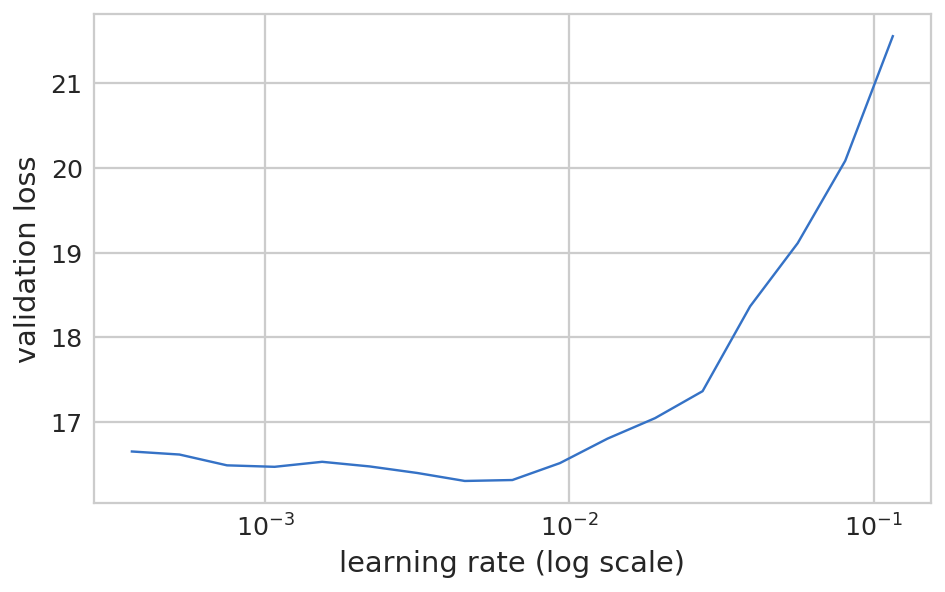

In [230]:
learn.lr_find(lrs/1000,1.)
learn.sched.plot(n_skip_end=1)

In [231]:
learn.fit(lrs, 1, cycle_len=10, use_clr=(20,10))

epoch      trn_loss   val_loss                            
    0      18.807729  34.186557 
    1      20.281371  21.784252                           
    2      19.392129  19.913282                           
    3      18.172636  18.960041                           
    4      16.900487  18.011309                           
    5      15.716368  17.454738                           
    6      14.717347  16.916381                           
    7      13.727865  16.583986                           
    8      12.809763  16.275561                           
    9      12.093133  16.069795                           


[array([16.06979])]

In [232]:
# 保存
learn.save('fl0')
learn.load('fl0')

In [233]:
# 优化训练
learn.freeze_to(-2)
learn.fit(lrs/4, 1, cycle_len=10, use_clr=(20,10))

epoch      trn_loss   val_loss                            
    0      11.201092  16.542418 
    1      11.259083  16.820294                           
    2      11.088501  16.641474                           
    3      10.854862  16.461994                           
    4      10.569602  16.541856                           
    5      10.20212   16.264861                           
    6      9.873908   16.241601                           
    7      9.576044   16.212703                           
    8      9.294867   16.157229                           
    9      9.012196   16.187851                           


[array([16.18785])]

In [234]:
learn.save('drop4')
learn.load('drop4')

In [236]:
# 可视化函数，根据阈值显示预测结果
def plot_results(thresh):
    x,y = next(iter(md.val_dl))
    y = V(y)
    batch = learn.model(V(x))
    b_clas,b_bb = batch

    x = to_np(x)
    fig, axes = plt.subplots(3, 4, figsize=(16, 12))
    for idx,ax in enumerate(axes.flat):
        ima=md.val_ds.ds.denorm(x)[idx]
        bbox,clas = get_y(y[0][idx], y[1][idx])
        a_ic = actn_to_bb(b_bb[idx], anchors)
        clas_pr, clas_ids = b_clas[idx].max(1)
        clas_pr = clas_pr.sigmoid()
        torch_gt(ax, ima, a_ic, clas_ids, clas_pr, clas_pr.max().data[0]*thresh)
    plt.tight_layout()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


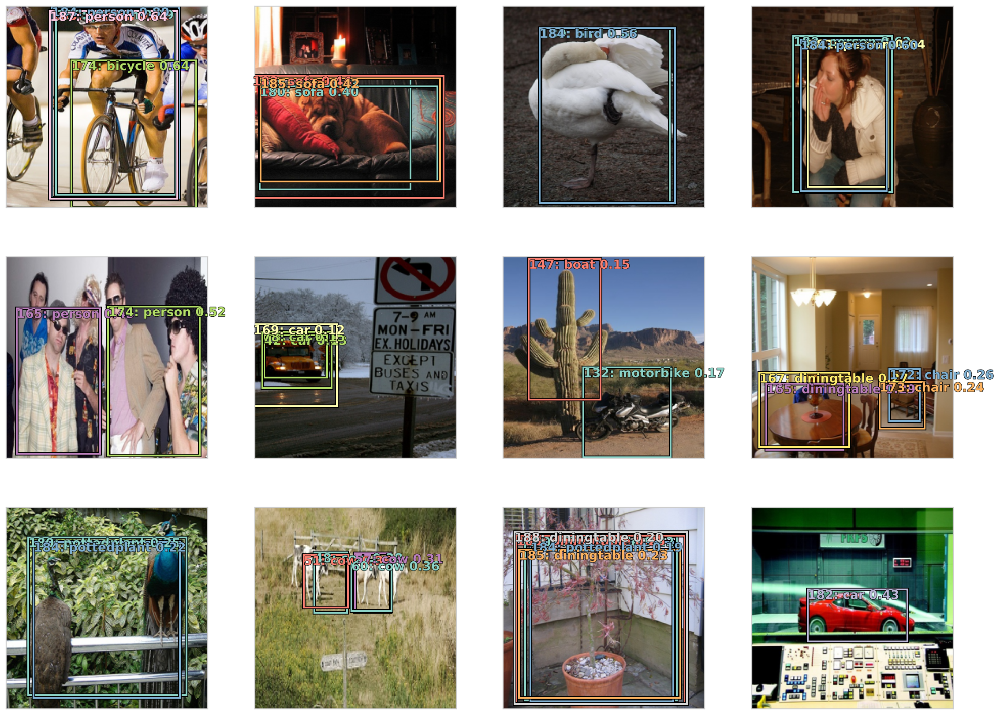

In [237]:
plot_results(0.75)

上面的预测已经差不多了，最后一步就是如何筛选出众多选项中最合适的一个作为结果了。也就是非极大抑制。

## 非极大抑制（NMS）

按照Howard的说法，NMS好理解，但比较繁琐，他也是直接摘的网上的一段代码。

In [239]:
# 定义NMS函数
def nms(boxes, scores, overlap=0.5, top_k=100):
    keep = scores.new(scores.size(0)).zero_().long()
    if boxes.numel() == 0: return keep
    x1 = boxes[:, 0]
    y1 = boxes[:, 1]
    x2 = boxes[:, 2]
    y2 = boxes[:, 3]
    area = torch.mul(x2 - x1, y2 - y1)
    v, idx = scores.sort(0)  # sort in ascending order
    idx = idx[-top_k:]  # indices of the top-k largest vals
    xx1 = boxes.new()
    yy1 = boxes.new()
    xx2 = boxes.new()
    yy2 = boxes.new()
    w = boxes.new()
    h = boxes.new()

    count = 0
    while idx.numel() > 0:
        i = idx[-1]  # index of current largest val
        keep[count] = i
        count += 1
        if idx.size(0) == 1: break
        idx = idx[:-1]  # remove kept element from view
        # load bboxes of next highest vals
        torch.index_select(x1, 0, idx, out=xx1)
        torch.index_select(y1, 0, idx, out=yy1)
        torch.index_select(x2, 0, idx, out=xx2)
        torch.index_select(y2, 0, idx, out=yy2)
        # store element-wise max with next highest score
        xx1 = torch.clamp(xx1, min=x1[i])
        yy1 = torch.clamp(yy1, min=y1[i])
        xx2 = torch.clamp(xx2, max=x2[i])
        yy2 = torch.clamp(yy2, max=y2[i])
        w.resize_as_(xx2)
        h.resize_as_(yy2)
        w = xx2 - xx1
        h = yy2 - yy1
        # check sizes of xx1 and xx2.. after each iteration
        w = torch.clamp(w, min=0.0)
        h = torch.clamp(h, min=0.0)
        inter = w*h
        # IoU = i / (area(a) + area(b) - i)
        rem_areas = torch.index_select(area, 0, idx)  # load remaining areas)
        union = (rem_areas - inter) + area[i]
        IoU = inter/union  # store result in iou
        # keep only elements with an IoU <= overlap
        idx = idx[IoU.le(overlap)]
    return keep, count

In [240]:
# 测试
x,y = next(iter(md.val_dl))
y = V(y)
batch = learn.model(V(x))
b_clas,b_bb = batch
x = to_np(x)

In [241]:
def show_nmf(idx):
    ima=md.val_ds.ds.denorm(x)[idx]
    bbox,clas = get_y(y[0][idx], y[1][idx])
    a_ic = actn_to_bb(b_bb[idx], anchors)
    clas_pr, clas_ids = b_clas[idx].max(1)
    clas_pr = clas_pr.sigmoid()

    conf_scores = b_clas[idx].sigmoid().t().data

    out1,out2,cc = [],[],[]
    for cl in range(0, len(conf_scores)-1):
        c_mask = conf_scores[cl] > 0.25
        if c_mask.sum() == 0: continue
        scores = conf_scores[cl][c_mask]
        l_mask = c_mask.unsqueeze(1).expand_as(a_ic)
        boxes = a_ic[l_mask].view(-1, 4)
        ids, count = nms(boxes.data, scores, 0.4, 50)
        ids = ids[:count]
        out1.append(scores[ids])
        out2.append(boxes.data[ids])
        cc.append([cl]*count)
    if not cc:
        print(f"{i}: empty array")
        return
    cc = T(np.concatenate(cc))
    out1 = torch.cat(out1)
    out2 = torch.cat(out2)

    fig, ax = plt.subplots(figsize=(8,8))
    torch_gt(ax, ima, out2, cc, out1, 0.1)

5: empty array
6: empty array


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


10: empty array


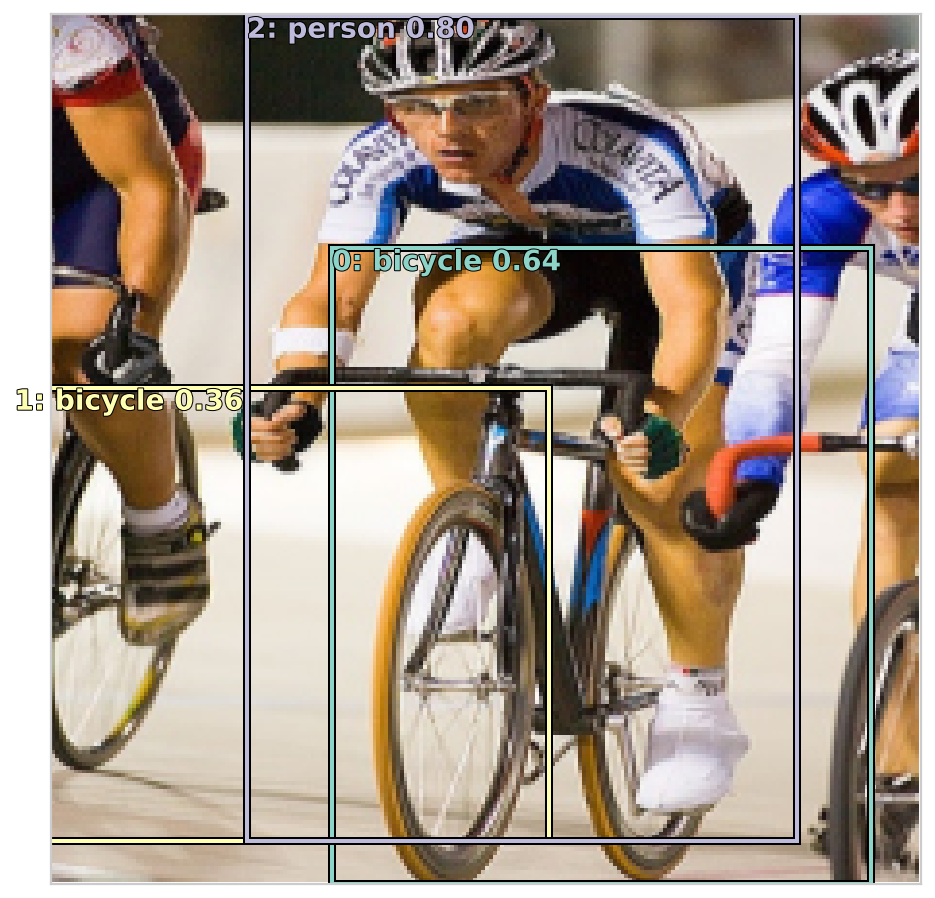

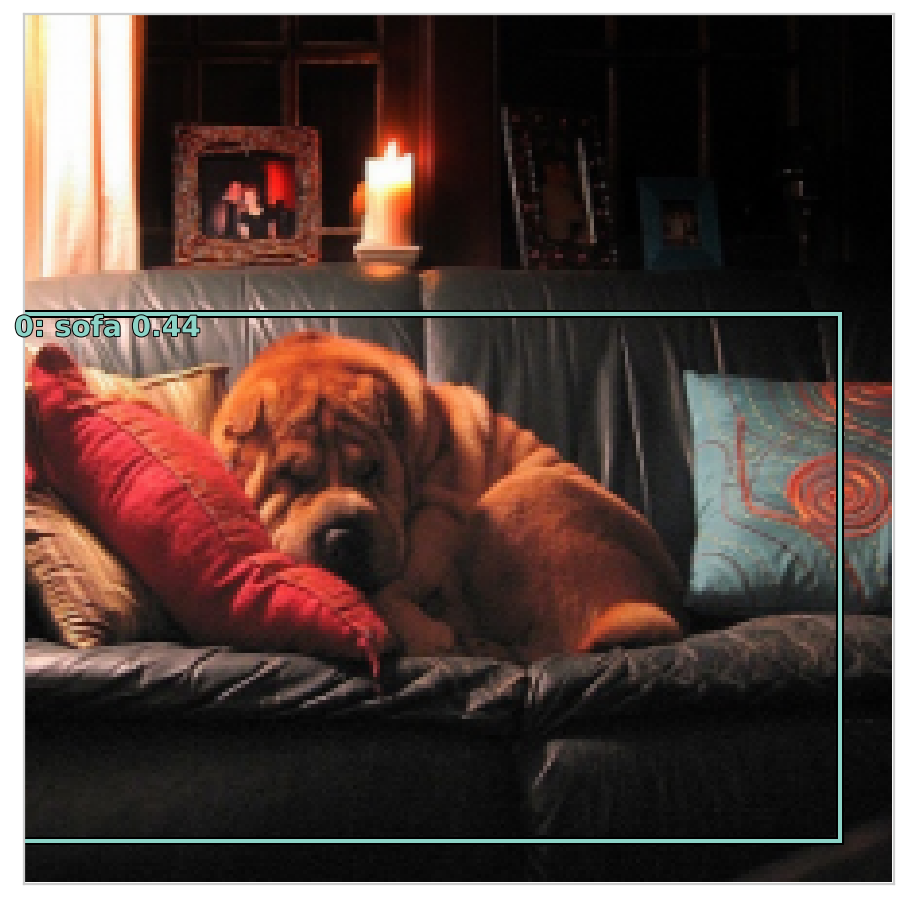

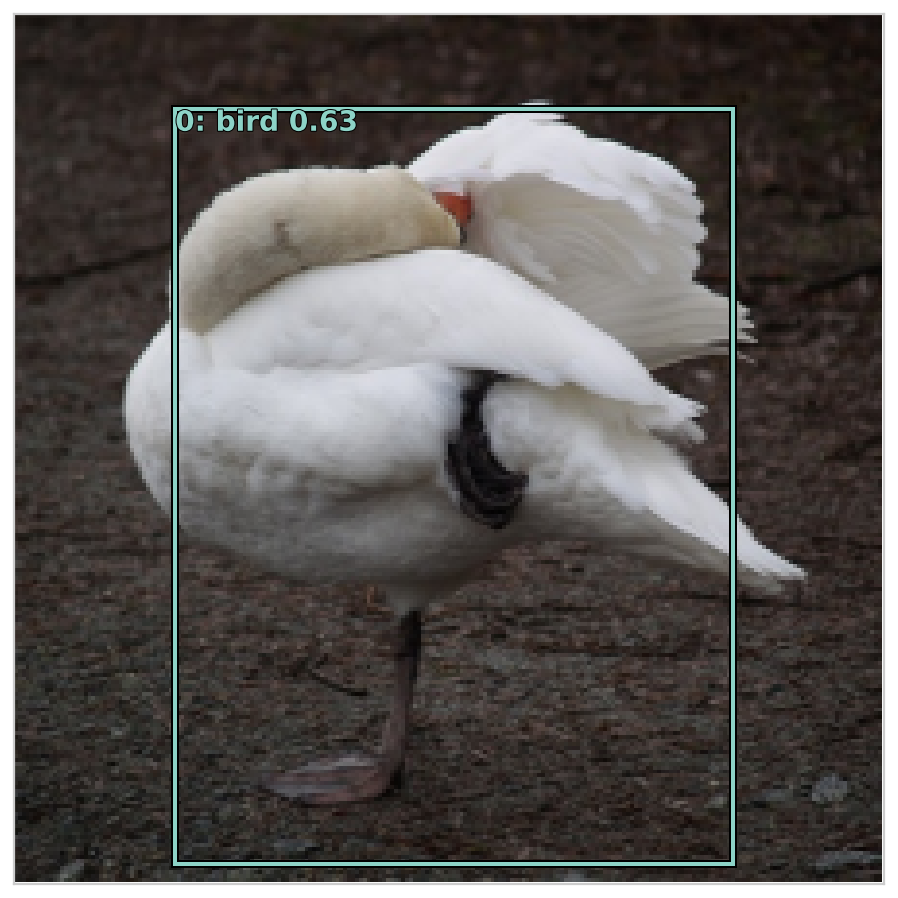

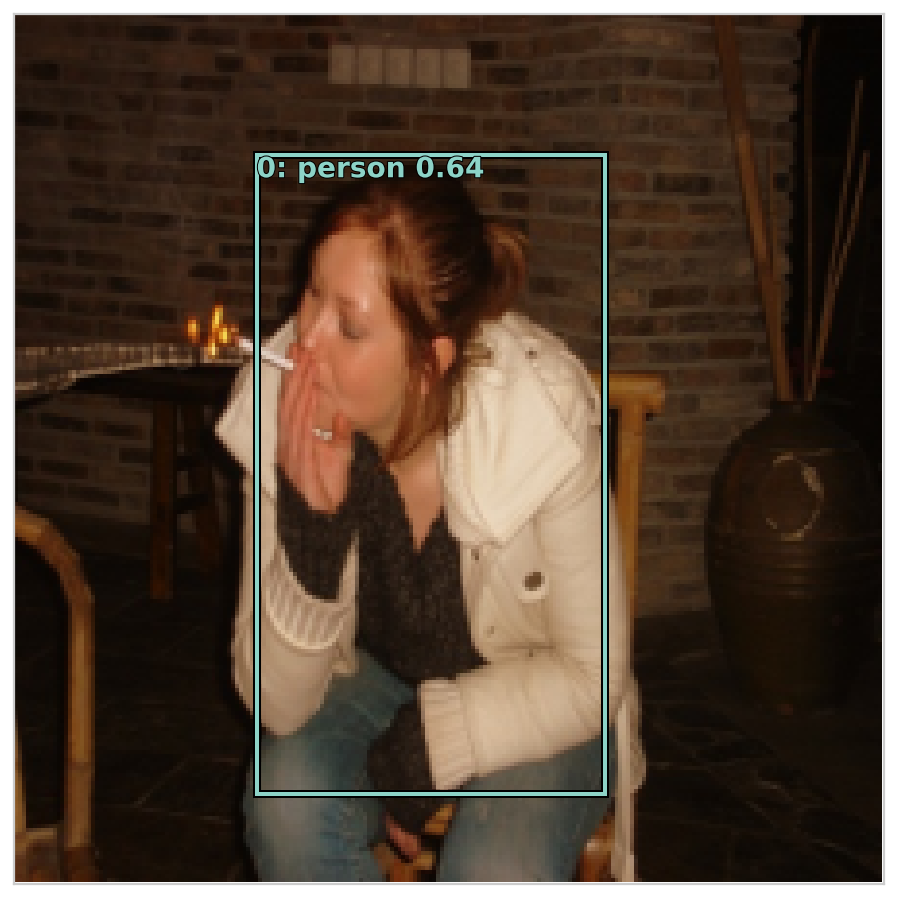

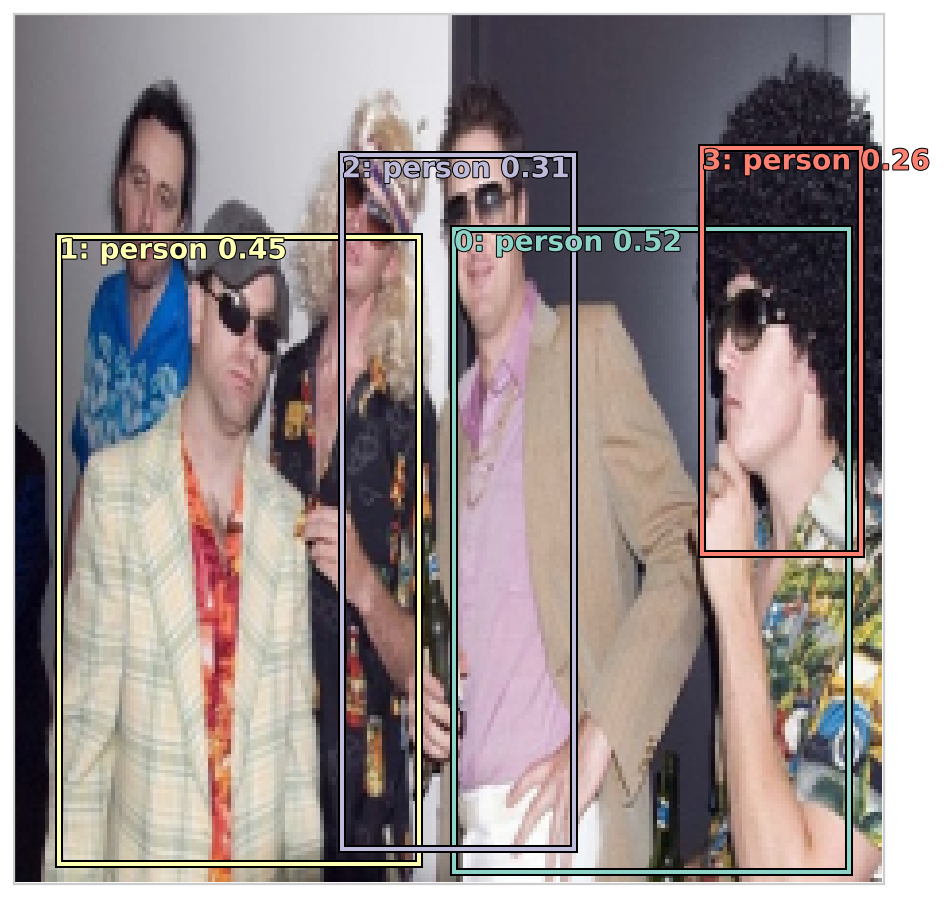

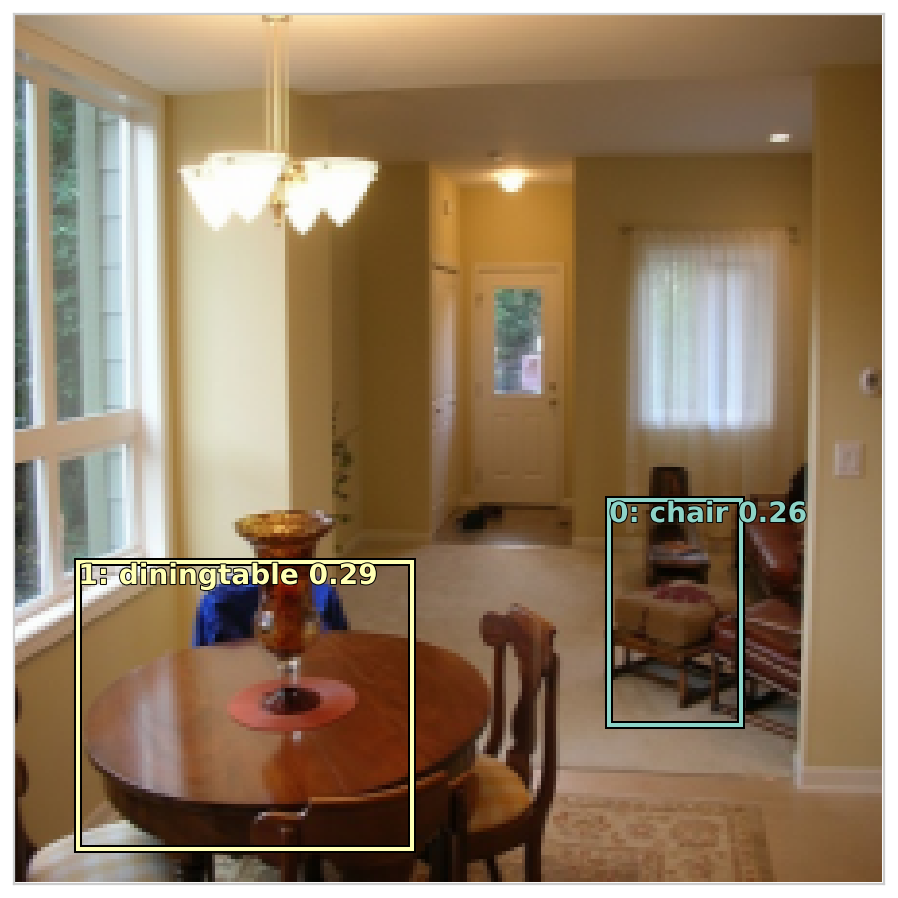

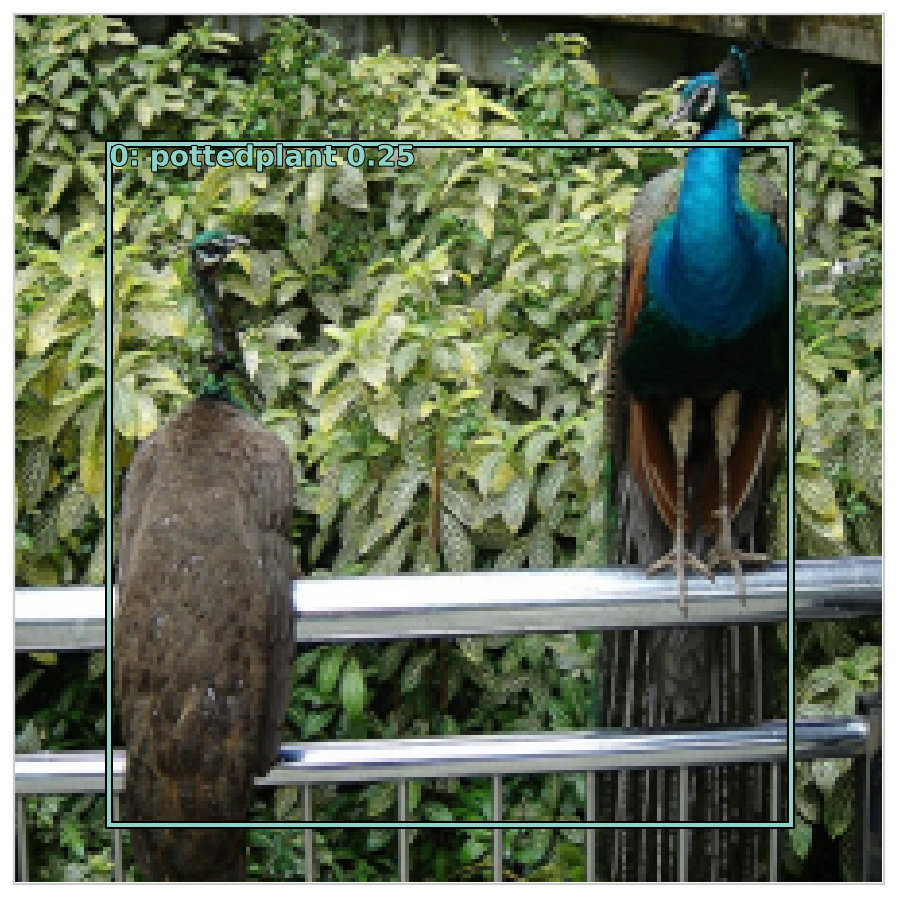

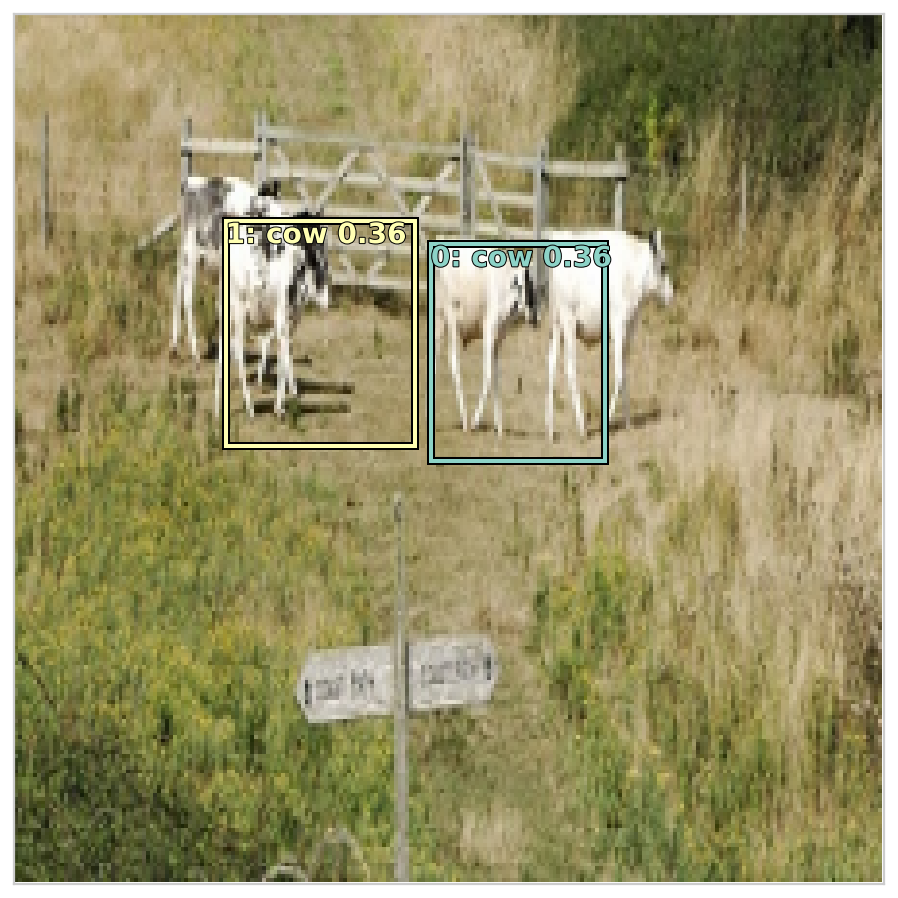

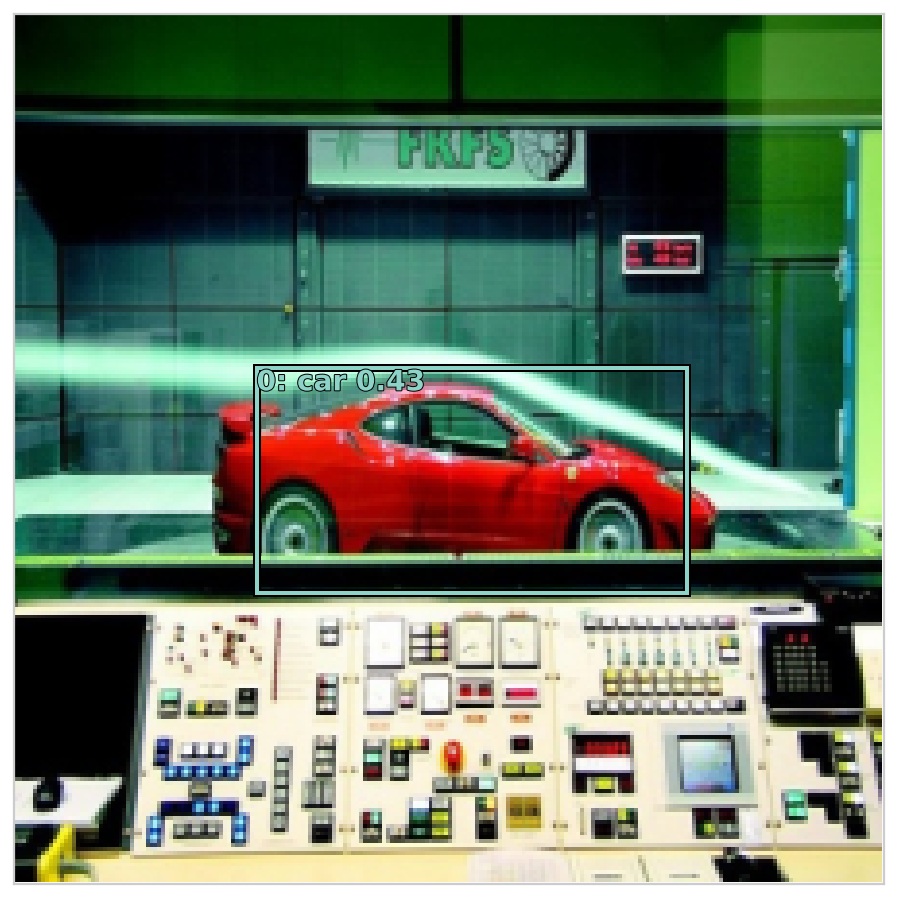

In [242]:
for i in range(12): show_nmf(i)

# End

效果还是有待提升，先去看SSD 论文了。

[SSD: Single Shot MultiBox Detector](https://arxiv.org/abs/1512.02325)